In [1]:
import brian2 as b2 # used for neural simulation
from brian2 import *

import numpy as np # used for array operations
from scipy.stats import poisson, binom, f, multivariate_normal, stats # used for stats (mean, s.d.)
from scipy import stats
from scipy.special import gammaln

import matplotlib.pyplot as plt # used for plotting
from matplotlib import gridspec
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D

import math
import random
import warnings
import json

b2.prefs.codegen.target = "numpy" # set Brian2 to use numpy backend

# from sklearn.feature_selection import f_classif
# from brian2 import NeuronGroup, Synapses, PoissonGroup, SpikeMonitor, run, ms, Hz, PoissonInput, clear_cache, device, get_unit, second

In [2]:
# %run neural_simulation_functions.ipynb

In [3]:
#import the python file
# once everything is good run this

from neural_simulation_functions import *

Parameters.

In [5]:
num_neurons = 10 # try 10 just to see covariance matrices
rate = 20 # change back to 10
rates = np.linspace(21, 30, num_neurons) # change back to np.linspace(5, 14, num_neurons)
time = 1000
num_samples = 100 # change to 100 to show Alex next time, but plot the first five trajectories or random five 
t0 = 200
time_points = np.arange(0, 1000)

In [6]:
rates

array([21., 22., 23., 24., 25., 26., 27., 28., 29., 30.])

In [7]:
# Single rate absolute (perturbation magnitude with rate): std_dev = perturbation_magnitude * base_rates[neuron]
perturbed_rate1 = generate_perturbed_rates(num_neurons, rate, perturbation_magnitude = 0.1, absolute=True)
# each neuron has a rate of 10 hz
print(perturbed_rate1)

[21.35819237 19.00739807 21.54493824 20.75939812 17.2945307  22.31024407
 19.28833321 21.35752897 17.48613182 20.72180831]


In [8]:
# Single rate relative (perturbation magnitude without rate): std_dev = perturbation_magnitude
perturbed_rate2 = generate_perturbed_rates(num_neurons, rate, perturbation_magnitude = 0.1, absolute=False)
# each neuron has a rate of 10 hz
print(perturbed_rate2)

[19.97768096 20.03777715 19.81070346 19.94746577 20.05697062 19.89847889
 20.17250943 20.11060231 20.10874608 20.16039353]


In [9]:
# Multi rate absolute (perturbation magnitude with rate): std_dev = perturbation_magnitude * base_rates[neuron]
perturbed_rates1 = generate_perturbed_rates(num_neurons, rates, perturbation_magnitude = 0.1, absolute=True)
print(perturbed_rates1)

[17.39165128 19.20531729 22.9771158  24.66101574 22.72664787 27.02518547
 26.62414901 23.60771316 27.91312098 30.08431103]


In [10]:
# Multi rate relative (perturbation magnitude without rate): std_dev = perturbation_magnitude
perturbed_rates2 = generate_perturbed_rates(num_neurons, rates, perturbation_magnitude = 0.1, absolute=False)
print(perturbed_rates2)

[20.84506896 21.99166289 23.11234873 24.03413208 25.09100529 26.09854618
 26.95566336 27.87774343 29.05787218 30.14470558]


In [11]:
# Simulation control parameters

# Network parameters
N_E = 1000
#gamma = 0.25                    # ratio of inhibitory to excitatory neurons
#N_I = round(gamma * N_E)
#N = N_E + N_I
epsilon = 0.5                   # Sparsity of connections.  changed from 0.1, 0.2 was fine...
#C_E = epsilon * N_E             # number of excitatory connections per neuron
#C_ext = C_E                     # external connections per neuron


# Neuron parameters
#tau = 20  * ms                  # Membrane time constant. previously 20, tried 50 it was weird, larger numbers more spikes, smaller numbers less spikes
                                # Higher Tau means slower decay, more spikes.
                                # Lower Tau means faster decay, fewer spikes
#theta = 20  * mV                # spike threshold voltage, neuron fires when hitting this value
#V_r = 10  * mV                  # reset potential, voltage neuron goes back to after firing
#tau_rp = 2  * ms                # refractory period (neuron needs to wait some time before spiking again)

# Synapse parameters
#J = 0.1 * mV                    # Synaptic strength # Previously 0.1 * mV, previouysly 0.075, 0.2 was too varied need to be more consistent
                                # larger J, stronger synaptic input, higher firing rate
                                # smaller J, weaker input, lower firing rates
#D = 1.5  * ms                   # synaptic delay, time between a pre spike and its effect on postsynap neuron

# Simulation settings
#dt = 0.1  * ms
g = 4                           # g is a good control for manipulating the firing rate, smaller numbers more spikes, bigger numbers less spikes
                                # Higher g, stronger inhibition, suppresses network activity
                                # Lower g, weaker inhibition, increase network activity
nu_ext_over_nu_thr = 1          # Previously 2, 1.2 was weird, 1 (made 2d plot nice), 0.5 not good,
# t_range = [1000, 1200]
# rate_range = [0, 200]
# rate_tick_step = 50

#nu_thr = theta / (J * C_E * tau) # minimal input rate needed to reach threshold
#nu_ext = nu_ext_over_nu_thr * nu_thr # external input rate

# adjust g and nu_ext so that nu_ext is approximately the number of spikes that are occuring, influenced by g. 
# epsilon 0.2 and g = 2.6, g = 2.8 is too much,tau = 50
# epsilon 0.5 and g = 4, tau = 20

Generating spike trains, then counting the spikes.

In [13]:
raw_spike_train = independent_poisson_processes(num_neurons, rate, time, num_samples)
# print(raw_spike_train)

In [14]:
save_spike_trains(raw_spike_train, "spike_trains.json")
loaded_spike_trains = load_spike_trains("spike_trains.json")
# print(loaded_spike_trains)

Spike trains saved to spike_trains.json


In [15]:
spike_train = standardize_units(raw_spike_train)
# print(spike_train)

In [16]:
raw_multi_rate_spike_train = multivariate_constant_poisson(num_neurons, rates, time, num_samples)

WARNING    'rates' is an internal variable of group 'poissongroup', but also exists in the run namespace with the value array([21., 22., 23., 24., 25., 26., 27., 28., 29., 30.]). The internal variable will be used. [brian2.groups.group.Group.resolve.resolution_conflict]


In [17]:
save_spike_trains(raw_multi_rate_spike_train, "multi_rate_spike_trains.json")
loaded_spike_trains = load_spike_trains("multi_rate_spike_trains.json")

Spike trains saved to multi_rate_spike_trains.json


In [18]:
multi_rate_spike_train = standardize_units(raw_multi_rate_spike_train)

In [19]:
raw_perturbed_rate_spike_train = multivariate_constant_poisson(num_neurons, perturbed_rates1, time, num_samples)

WARNING    'rates' is an internal variable of group 'poissongroup', but also exists in the run namespace with the value array([17.39165128, 19.20531729, 22.9771158 , 24.66101574, 22.72664787,
       27.02518547, 26.62414901, 23.60771316, 27.91312098, 30.08431103]). The internal variable will be used. [brian2.groups.group.Group.resolve.resolution_conflict]


In [20]:
save_spike_trains(raw_perturbed_rate_spike_train, "perturbed_rate_spike_trains.json")
loaded_spike_trains = load_spike_trains("perturbed_rate_spike_trains.json")

Spike trains saved to perturbed_rate_spike_trains.json


In [21]:
perturbed_rate_spike_train = standardize_units(raw_perturbed_rate_spike_train)

In [22]:
# first_spike = find_nth_earliest_spike(spike_train, n=2)

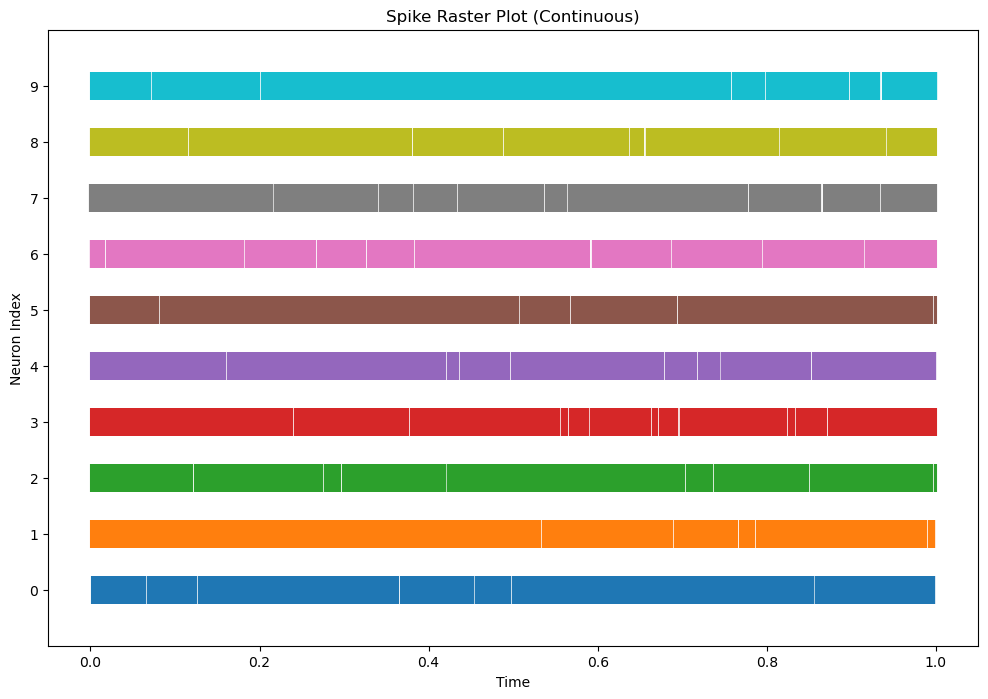

In [23]:
raster_plot(spike_train, colors=None, linelengths=None, figsize=(12,8))

In [24]:
binary_spikes = spikes_to_binary(spike_train, num_neurons, time)
multi_rate_binary_spikes = spikes_to_binary(multi_rate_spike_train, num_neurons, time)
perturbed_rate_binary_spikes = spikes_to_binary(perturbed_rate_spike_train, num_neurons, time)

In [25]:
spike_count = count_spikes(binary_spikes)
count = np.array(spike_count)
# print(count)
# print(count.shape)
multi_rate_spike_count = count_spikes(multi_rate_binary_spikes)
multi_rate_count = np.array(multi_rate_spike_count)

perturbed_rate_spike_count = count_spikes(perturbed_rate_binary_spikes)
perturbed_rate_count = np.array(perturbed_rate_spike_count)

In [26]:
random_indices = np.random.choice(count.shape[0], size=5, replace=False)  # No duplicates
random_samples = count[random_indices]  # Shape: (5, neurons, time)

Getting spike trains from excitatory and inhibitory neurons, then counting the spikes.

In [28]:
# results = sim(params["g"], params["nu_ext_over_nu_thr"], params["t_range"][1] * ms, ax_spikes, ax_rates, params["rate_tick_step"], num_neurons, num_samples)
results = sim(N_E, epsilon, g, nu_ext_over_nu_thr, time, num_neurons, num_samples)

raw_excitatory_spike_trains = results['excitatory']['spike_trains']
raw_inhibitory_spike_trains = results['inhibitory']['spike_trains']
# print(raw_excitatory_spike_trains)

In [29]:
save_spike_trains(raw_excitatory_spike_trains, "spike_trains_ex.json")
loaded_spike_trains_ex = load_spike_trains("spike_trains_ex.json")

save_spike_trains(raw_inhibitory_spike_trains, "spike_trains_in.json")
loaded_spike_trains_in = load_spike_trains("spike_trains_in.json")

Spike trains saved to spike_trains_ex.json
Spike trains saved to spike_trains_in.json


In [30]:
excitatory_spike_trains = standardize_units(raw_excitatory_spike_trains)
inhibitory_spike_trains = standardize_units(raw_inhibitory_spike_trains)

#print(excitatory_spike_trains[0])
#print(inhibitory_spike_trains[0])

In [31]:
#first_spike_ex = find_nth_earliest_spike(excitatory_spike_trains, n=2)
#first_spike_in = find_nth_earliest_spike(inhibitory_spike_trains, n=2)

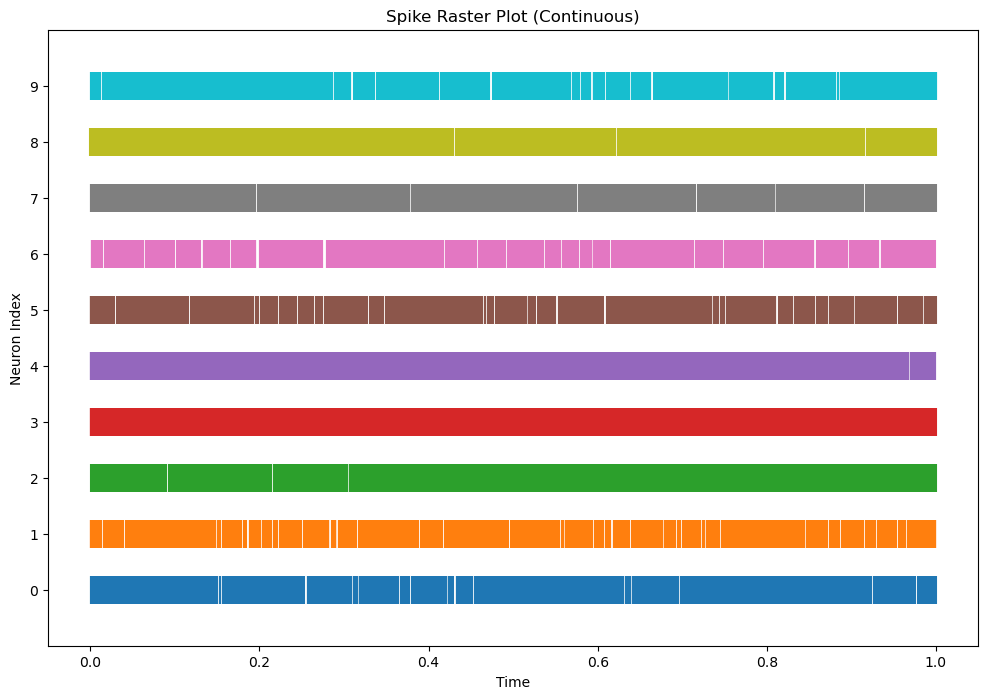

In [32]:
raster_plot(excitatory_spike_trains, colors=None, linelengths=None, figsize=(12,8))

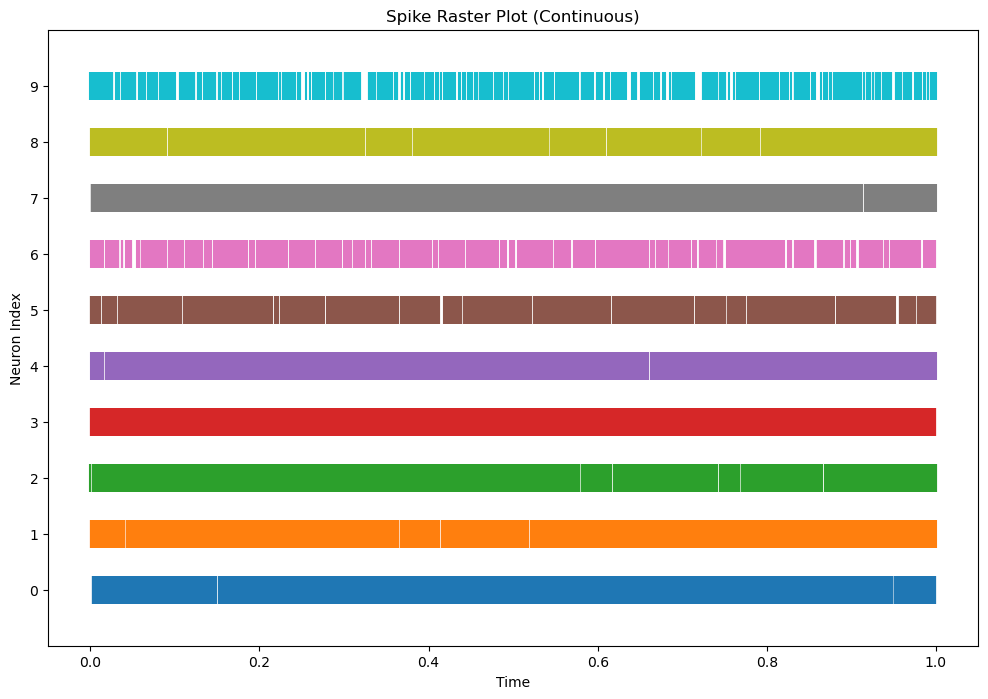

In [33]:
raster_plot(inhibitory_spike_trains, colors=None, linelengths=None, figsize=(12,8))

In [34]:
binary_ex_spikes = spikes_to_binary(excitatory_spike_trains, num_neurons, time)
binary_in_spikes = spikes_to_binary(inhibitory_spike_trains, num_neurons, time)
# print(binary_ex_spikes[0][0]) # first sample of first neuron

In [35]:
spike_count_ex = count_spikes(binary_ex_spikes)
count_ex = np.array(spike_count_ex)
#print(spike_count_ex[0])
#print(count_ex[0])
#print(count_ex[1])
#print(count_ex.shape)

spike_count_in = count_spikes(binary_in_spikes)
count_in = np.array(spike_count_in)
#print(count_in.shape)

In [36]:
random_indices_ex = np.random.choice(count_ex.shape[0], size=5, replace=False)  # No duplicates
random_samples_ex = count_ex[random_indices_ex]  # Shape: (5, neurons, time)

random_indices_in = np.random.choice(count_in.shape[0], size=5, replace=False)  # No duplicates
random_samples_in = count_in[random_indices_in]  # Shape: (5, neurons, time)

Theoretical and Empirical stats of raw counts.

In [38]:
# empirical_mean = empirical_means(count) # np.mean(count, axis=0), count.mean(axis=0)
empirical_mean = count.mean(axis=0)
#print(empirical_mean.shape)
count_rate = empirical_mean[:, -1]
#print(count_rate.shape)
#print(empirical_mean)
#print(empirical_mean.shape)
#print(count_rate)

# empirical_std_dev = std_dev_empirical_mean(empirical_mean, num_samples, count)
empirical_std_dev = np.sqrt(empirical_mean) #count.std(axis=0, ddof=1)
# empirical_std_dev = (count.std(axis=0)) #newly added, should be the same but isn't
# i fixed the above by using empirical_std_dev = (count.std(axis=0, ddof=1))
#print(empirical_std_dev)
#print(empirical_std_dev.shape)

empirical_lower_bound, empirical_upper_bound = confidence_intervals(empirical_mean, empirical_std_dev, num_samples, confidence_level=0.95)
# print(empirical_lower_bound)
# print(empirical_upper_bound)

In [39]:
multi_rate_empirical_mean = multi_rate_count.mean(axis=0)
multi_rate_count_rate = multi_rate_empirical_mean[:, -1]
multi_rate_empirical_std_dev = np.sqrt(multi_rate_empirical_mean) #count.std(axis=0, ddof=1)

multi_rate_empirical_lower_bound, multi_rate_empirical_upper_bound = confidence_intervals(multi_rate_empirical_mean, multi_rate_empirical_std_dev, num_samples, confidence_level=0.95)

In [40]:
perturbed_rate_empirical_mean = perturbed_rate_count.mean(axis=0)
perturbed_rate_count_rate = perturbed_rate_empirical_mean[:, -1]
perturbed_rate_empirical_std_dev = np.sqrt(perturbed_rate_empirical_mean) #count.std(axis=0, ddof=1)

perturbed_rate_empirical_lower_bound, perturbed_rate_empirical_upper_bound = confidence_intervals(perturbed_rate_empirical_mean, perturbed_rate_empirical_std_dev, num_samples, confidence_level=0.95)

In [41]:
exclude_times, global_exclude = last_zero_std_time(empirical_std_dev, verbose=True)

Neuron 0: last zero std at t=1, recommended exclude=2
Neuron 1: last zero std at t=-1, recommended exclude=0
Neuron 2: last zero std at t=0, recommended exclude=1
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=0, recommended exclude=1
Neuron 5: last zero std at t=-1, recommended exclude=0
Neuron 6: last zero std at t=-1, recommended exclude=0
Neuron 7: last zero std at t=-1, recommended exclude=0
Neuron 8: last zero std at t=-1, recommended exclude=0
Neuron 9: last zero std at t=0, recommended exclude=1

Global exclude (safest): t=2


In [42]:
multi_rate_exclude_times, multi_rate_global_exclude = last_zero_std_time(multi_rate_empirical_std_dev, verbose=True)

Neuron 0: last zero std at t=-1, recommended exclude=0
Neuron 1: last zero std at t=-1, recommended exclude=0
Neuron 2: last zero std at t=-1, recommended exclude=0
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=-1, recommended exclude=0
Neuron 6: last zero std at t=-1, recommended exclude=0
Neuron 7: last zero std at t=-1, recommended exclude=0
Neuron 8: last zero std at t=-1, recommended exclude=0
Neuron 9: last zero std at t=-1, recommended exclude=0

Global exclude (safest): t=0


In [43]:
perturbed_rate_exclude_times, perturbed_rate_global_exclude = last_zero_std_time(perturbed_rate_empirical_std_dev, verbose=True)

Neuron 0: last zero std at t=0, recommended exclude=1
Neuron 1: last zero std at t=-1, recommended exclude=0
Neuron 2: last zero std at t=0, recommended exclude=1
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=-1, recommended exclude=0
Neuron 6: last zero std at t=0, recommended exclude=1
Neuron 7: last zero std at t=-1, recommended exclude=0
Neuron 8: last zero std at t=-1, recommended exclude=0
Neuron 9: last zero std at t=-1, recommended exclude=0

Global exclude (safest): t=1


In [44]:
theoretical_means = calculate_theoretical_mean(count_rate, time)
#print(theoretical_means)
#print(theoretical_means.shape)

theoretical_std_dev = calculate_theoretical_std_dev(theoretical_means)
#print(theoretical_std_dev)
#print(theoretical_std_dev.shape)

theoretical_lower_bound, theoretical_upper_bound = confidence_intervals(theoretical_means, theoretical_std_dev, num_samples, confidence_level=0.95)
# print(theoretical_lower_bound)
# print(theoretical_upper_bound)

In [45]:
multi_rate_theoretical_means = calculate_theoretical_mean(multi_rate_count_rate, time)
multi_rate_theoretical_std_dev = calculate_theoretical_std_dev(multi_rate_theoretical_means)

multi_rate_theoretical_lower_bound, multi_rate_theoretical_upper_bound = confidence_intervals(multi_rate_theoretical_means, multi_rate_theoretical_std_dev, num_samples, confidence_level=0.95)

In [46]:
perturbed_rate_theoretical_means = calculate_theoretical_mean(perturbed_rate_count_rate, time)
perturbed_rate_theoretical_std_dev = calculate_theoretical_std_dev(perturbed_rate_theoretical_means)

perturbed_rate_theoretical_lower_bound, perturbed_rate_theoretical_upper_bound = confidence_intervals(perturbed_rate_theoretical_means, perturbed_rate_theoretical_std_dev, num_samples, confidence_level=0.95)

In [47]:
res_var = variance_of_residuals(empirical_mean, theoretical_means)
#print(res_var)

In [48]:
centers = center_counts_loop(count, theoretical_means, num_samples, num_neurons)

centers_mean = np.mean(centers, axis = 0)
centers_std_dev = np.std(centers, axis = 0, ddof = 1)

centers_emp = center_counts_loop(count, empirical_mean, num_samples, num_neurons)

centers_mean_emp = np.mean(centers_emp, axis = 0)
centers_std_dev_emp = np.std(centers_emp, axis = 0, ddof = 1)

In [49]:
multi_rate_centers = center_counts_loop(multi_rate_count, multi_rate_theoretical_means, num_samples, num_neurons)

multi_rate_centers_mean = np.mean(multi_rate_centers, axis = 0)
multi_rate_centers_std_dev = np.std(multi_rate_centers, axis = 0, ddof = 1)

multi_rate_centers_emp = center_counts_loop(multi_rate_count, multi_rate_empirical_mean, num_samples, num_neurons)

multi_rate_centers_mean_emp = np.mean(multi_rate_centers_emp, axis = 0)
multi_rate_centers_std_dev_emp = np.std(multi_rate_centers_emp, axis = 0, ddof = 1)

In [50]:
perturbed_rate_centers = center_counts_loop(perturbed_rate_count, perturbed_rate_theoretical_means, num_samples, num_neurons)

perturbed_rate_centers_mean = np.mean(perturbed_rate_centers, axis = 0)
perturbed_rate_centers_std_dev = np.std(perturbed_rate_centers, axis = 0, ddof = 1)

perturbed_rate_centers_emp = center_counts_loop(perturbed_rate_count, perturbed_rate_empirical_mean, num_samples, num_neurons)

perturbed_rate_centers_mean_emp = np.mean(perturbed_rate_centers_emp, axis = 0)
perturbed_rate_centers_std_dev_emp = np.std(perturbed_rate_centers_emp, axis = 0, ddof = 1)

Poisson Standardization 

In [52]:
stands = standardize_counts_loop(count, theoretical_means, theoretical_std_dev, num_samples, num_neurons, exclude = 1)
#print(stands)
#print(stands.shape)
# we removed the very first time point for this dataset

stands_emp = standardize_counts_loop(count, empirical_mean, empirical_std_dev, num_samples, num_neurons, global_exclude)
#print(stands_emp)
# cleaned_stands_emp = stands_emp[:, ~np.isnan(stands_emp).all(axis=0)]

#print(stands_emp.shape)
# we need to remove a few of the first time points for this dataset

# WHENEVER WE CHANGE TIME, WE NEED TO HAVE IT BE KNOWN, 

# when i do covariance, i should reshape from num_samples, num_neurons, time , assume poisson but not assume independent, the variance and covariance should be equal
# time to something with time as replicate. replicate (num_samples) times time in dimension, num_neurons
# covariance, num_neurons by num_neurons, data to produce this should be num_samples times num_neurons
# reformat the current matrix, use reshape with the matrix, maybe with loops 

standardized_mean_global = np.mean(stands)
standardized_std_global = np.std(stands)

standardized_mean_emp_global = np.mean(stands_emp)
standardized_std_emp_global = np.std(stands_emp)

standardized_mean = np.mean(stands, axis=0)
standardized_std = np.std(stands, axis=0, ddof = 1)

standardized_mean_emp = np.mean(stands_emp, axis = 0)
standardized_std_emp = np.std(stands_emp, axis = 0, ddof = 1)

In [53]:
has_negatives = np.any(stands < 0)
print(f"Array has negative numbers: {has_negatives}")
# this is why log-likelihood doesn't like me

Array has negative numbers: True


In [54]:
multi_rate_stands = standardize_counts_loop(multi_rate_count, multi_rate_theoretical_means, multi_rate_theoretical_std_dev, num_samples, num_neurons, exclude = 1)

multi_rate_stands_emp = standardize_counts_loop(multi_rate_count, multi_rate_empirical_mean, multi_rate_empirical_std_dev, num_samples, num_neurons, multi_rate_global_exclude)

multi_rate_standardized_mean_global = np.mean(multi_rate_stands)
multi_rate_standardized_std_global = np.std(multi_rate_stands)

multi_rate_standardized_mean_emp_global = np.mean(multi_rate_stands_emp)
multi_rate_standardized_std_emp_global = np.std(multi_rate_stands_emp)

multi_rate_standardized_mean = np.mean(multi_rate_stands, axis=0)
multi_rate_standardized_std = np.std(multi_rate_stands, axis=0, ddof = 1)

multi_rate_standardized_mean_emp = np.mean(multi_rate_stands_emp, axis = 0)
multi_rate_standardized_std_emp = np.std(multi_rate_stands_emp, axis = 0, ddof = 1)

In [55]:
perturbed_rate_stands = standardize_counts_loop(perturbed_rate_count, perturbed_rate_theoretical_means, perturbed_rate_theoretical_std_dev, num_samples, num_neurons, exclude = 1)

perturbed_rate_stands_emp = standardize_counts_loop(perturbed_rate_count, perturbed_rate_empirical_mean, perturbed_rate_empirical_std_dev, num_samples, num_neurons, perturbed_rate_global_exclude)

perturbed_rate_standardized_mean_global = np.mean(perturbed_rate_stands)
perturbed_rate_standardized_std_global = np.std(perturbed_rate_stands)

perturbed_rate_standardized_mean_emp_global = np.mean(perturbed_rate_stands_emp)
perturbed_rate_standardized_std_emp_global = np.std(perturbed_rate_stands_emp)

perturbed_rate_standardized_mean = np.mean(perturbed_rate_stands, axis=0)
perturbed_rate_standardized_std = np.std(perturbed_rate_stands, axis=0, ddof = 1)

perturbed_rate_standardized_mean_emp = np.mean(perturbed_rate_stands_emp, axis = 0)
perturbed_rate_standardized_std_emp = np.std(perturbed_rate_stands_emp, axis = 0, ddof = 1)

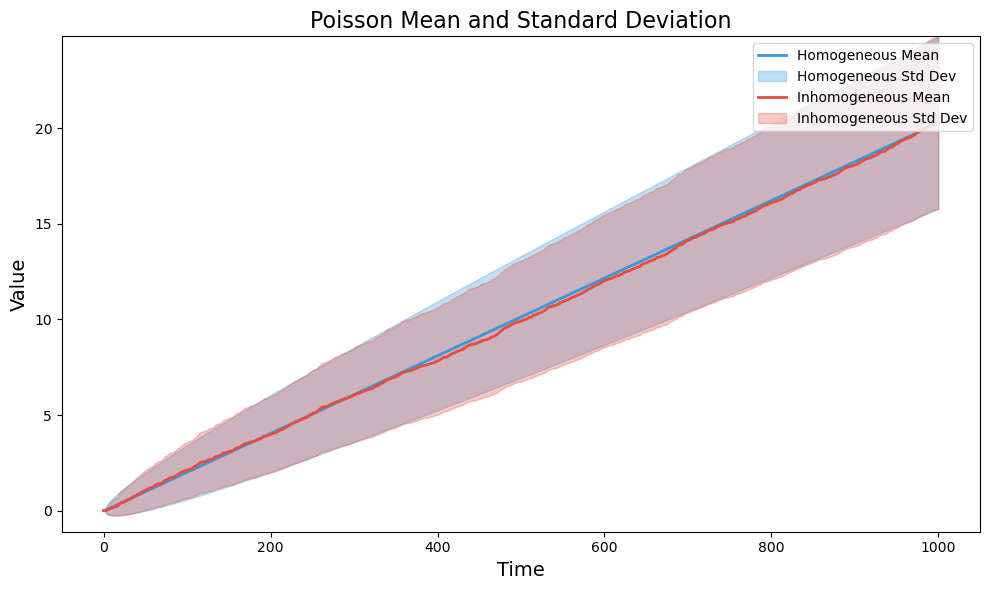

In [56]:
plot_stats(theoretical_means, empirical_mean, theoretical_std_dev, empirical_std_dev, title = 'Poisson Mean and Standard Deviation')

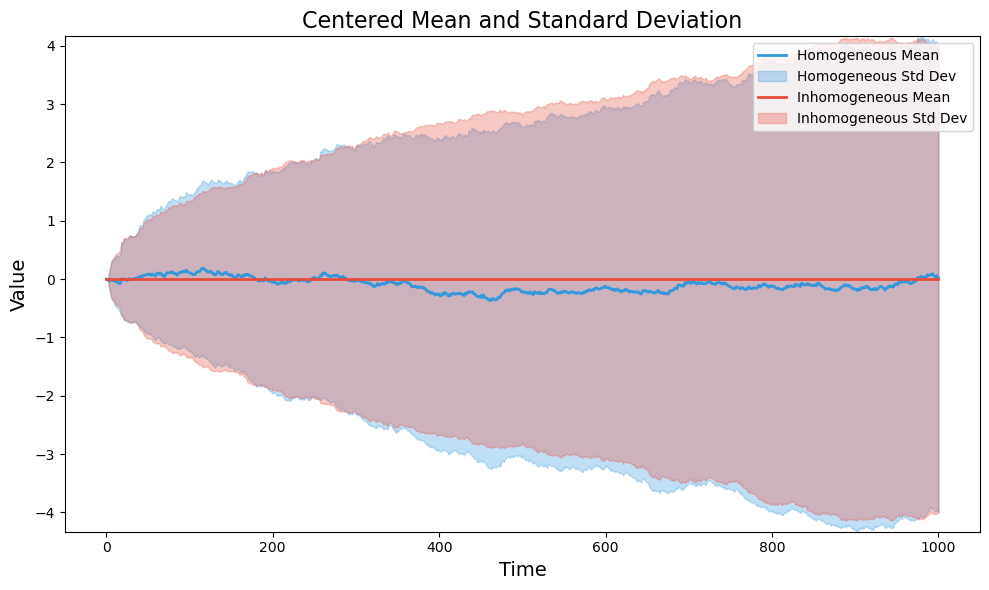

In [57]:
plot_stats(centers_mean, centers_mean_emp, centers_std_dev, centers_std_dev_emp, title = 'Centered Mean and Standard Deviation')

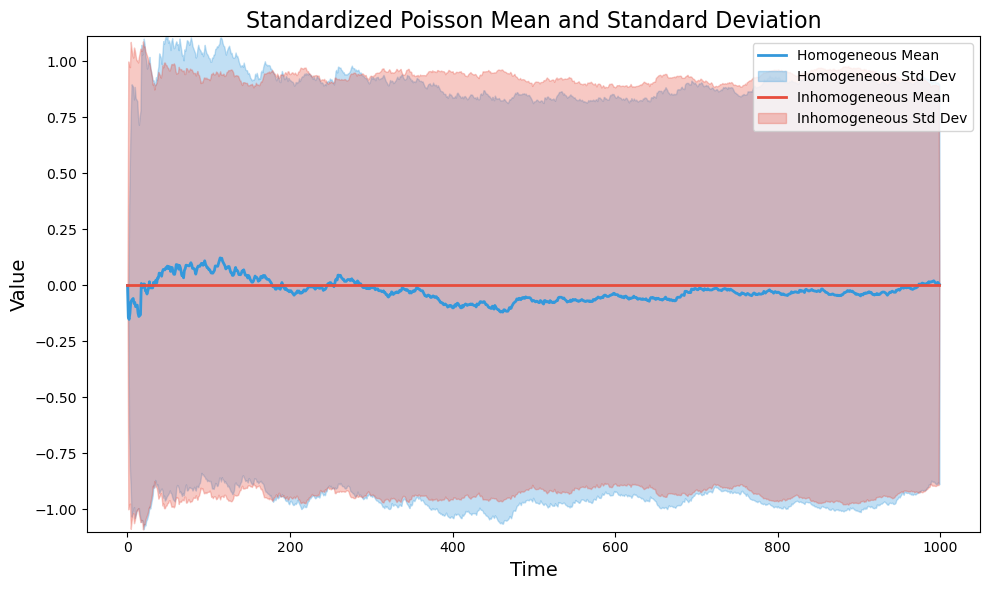

In [58]:
plot_stats(standardized_mean, standardized_mean_emp, standardized_std, standardized_std_emp, title = 'Standardized Poisson Mean and Standard Deviation')

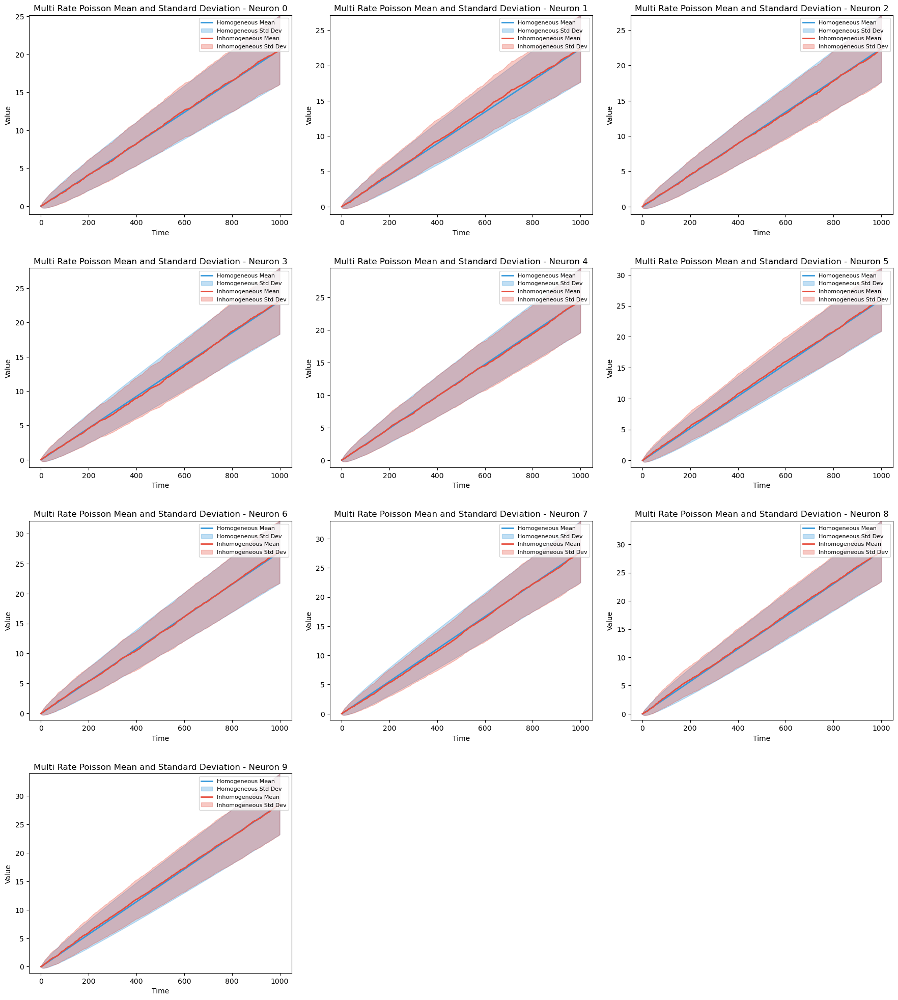

In [59]:
plot_multiple_stats(multi_rate_theoretical_means, multi_rate_empirical_mean, multi_rate_theoretical_std_dev, multi_rate_empirical_std_dev, title = 'Multi Rate Poisson Mean and Standard Deviation')
# Note in presentation highlight the difference y axis values between plots. For more precise plots we can go with isoclines.
# Aka lines with fixed probabilities

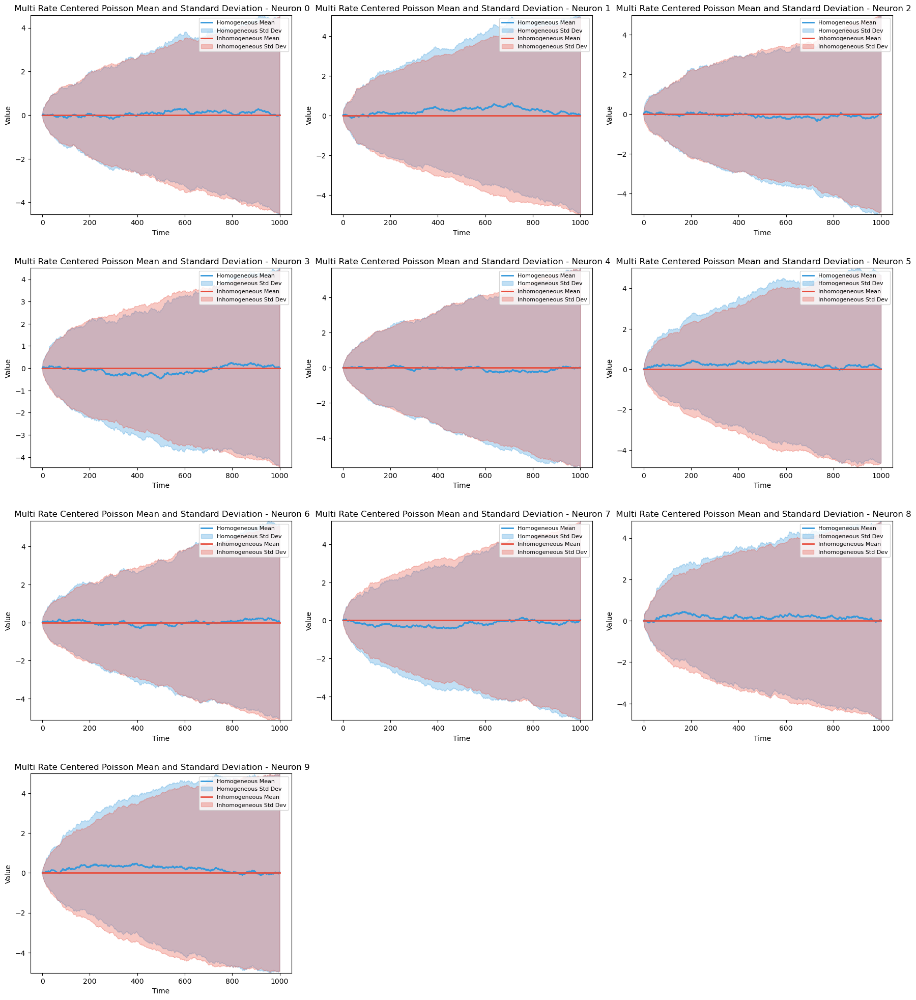

In [60]:
plot_multiple_stats(multi_rate_centers_mean, multi_rate_centers_mean_emp, multi_rate_centers_std_dev, multi_rate_centers_std_dev_emp, title = ' Multi Rate Centered Poisson Mean and Standard Deviation')
# Note in presentation highlight the difference y axis values between plots

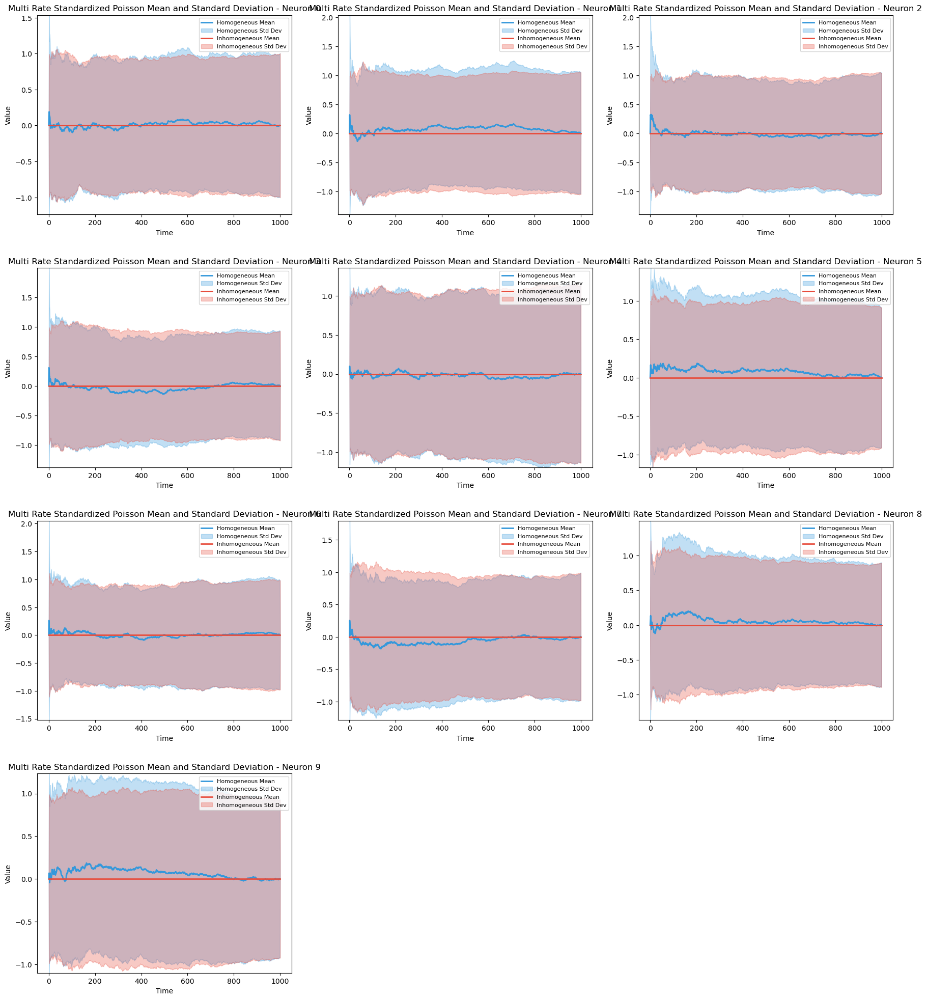

In [61]:
plot_multiple_stats(multi_rate_standardized_mean, multi_rate_standardized_mean_emp, multi_rate_standardized_std, multi_rate_standardized_std_emp, title = 'Multi Rate Standardized Poisson Mean and Standard Deviation')
# Note in presentation highlight the difference y axis values between plots

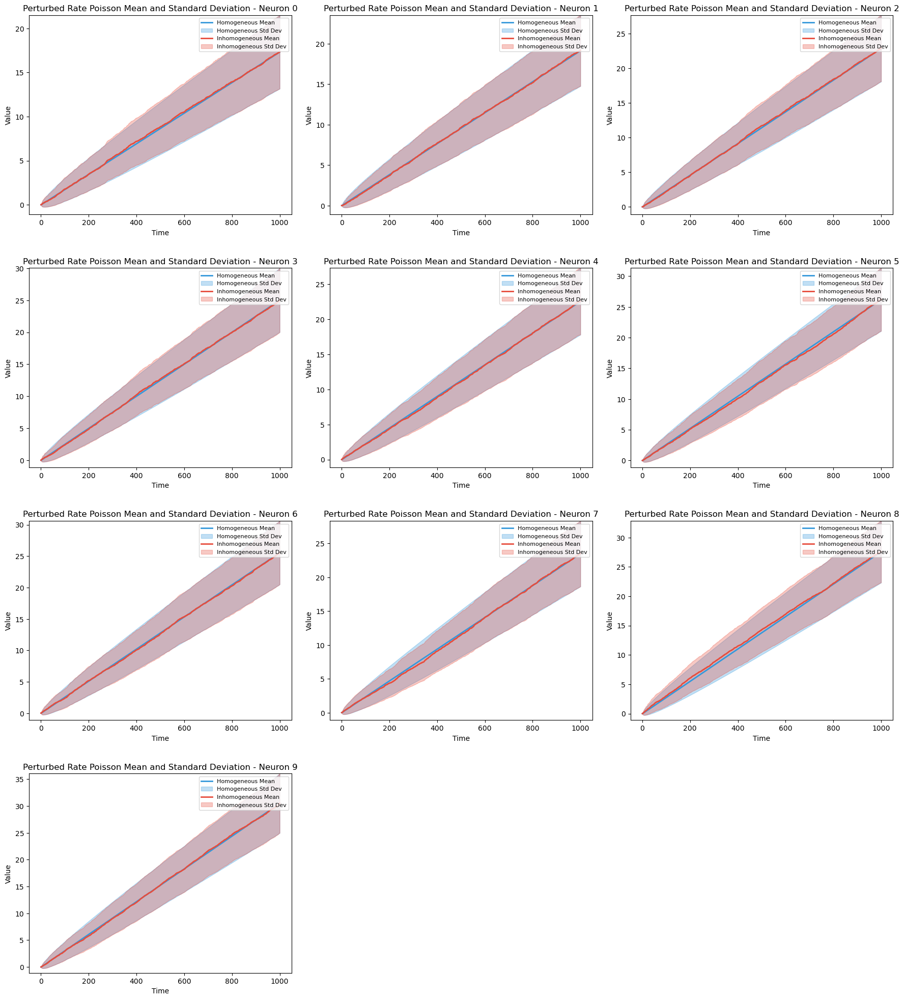

In [62]:
plot_multiple_stats(perturbed_rate_theoretical_means, perturbed_rate_empirical_mean, perturbed_rate_theoretical_std_dev, perturbed_rate_empirical_std_dev, title = 'Perturbed Rate Poisson Mean and Standard Deviation')
# Note in presentation highlight the difference y axis values between plots. For more precise plots we can go with isoclines.
# Aka lines with fixed probabilities

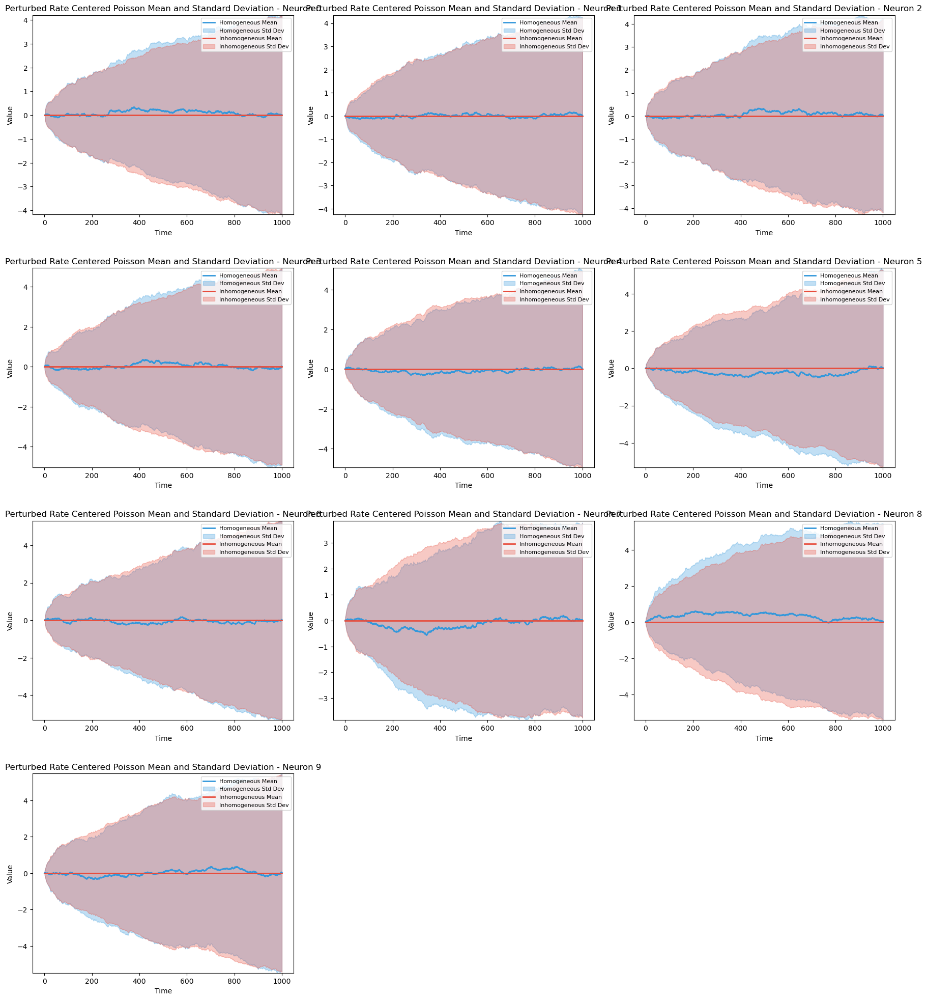

In [63]:
plot_multiple_stats(perturbed_rate_centers_mean, perturbed_rate_centers_mean_emp, perturbed_rate_centers_std_dev, perturbed_rate_centers_std_dev_emp, title = 'Perturbed Rate Centered Poisson Mean and Standard Deviation')
# Note in presentation highlight the difference y axis values between plots

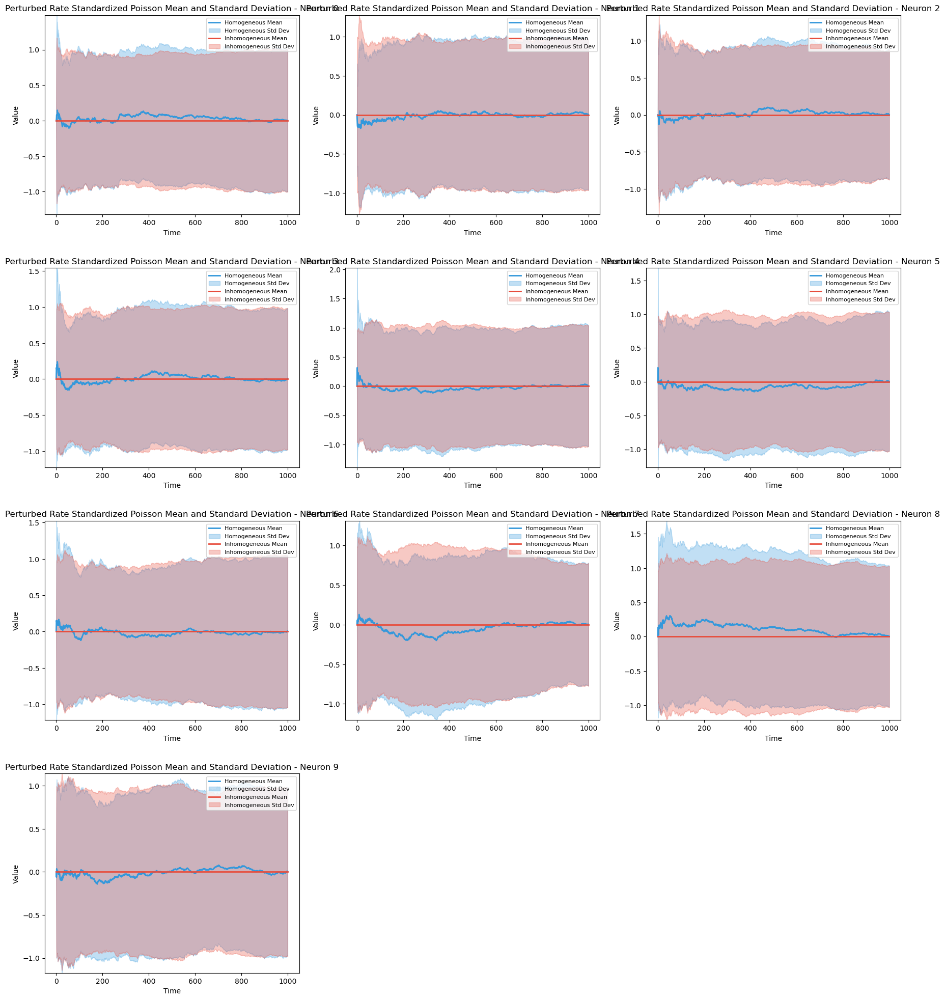

In [64]:
plot_multiple_stats(perturbed_rate_standardized_mean, perturbed_rate_standardized_mean_emp, perturbed_rate_standardized_std, perturbed_rate_standardized_std_emp, title = 'Perturbed Rate Standardized Poisson Mean and Standard Deviation')
# Note in presentation highlight the difference y axis values between plots

In [65]:
mean_check = check_mean_with_se(stands, expected_mean=0, confidence=0.95)
#print(mean_check)

mean_check_emp = check_mean_with_se(stands_emp, expected_mean=0, confidence=0.95)
#print(mean_check_emp)

In [66]:
multi_rate_mean_check = check_mean_with_se(multi_rate_stands, expected_mean=0, confidence=0.95)
multi_rate_mean_check_emp = check_mean_with_se(multi_rate_stands_emp, expected_mean=0, confidence=0.95)

In [67]:
perturbed_rate_mean_check = check_mean_with_se(perturbed_rate_stands, expected_mean=0, confidence=0.95)
perturbed_rate_mean_check_emp = check_mean_with_se(perturbed_rate_stands_emp, expected_mean=0, confidence=0.95)

In [68]:
serialized_count = serialize_counts(stands) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count.shape)
#print(np.mean(serialized_count))
t_stat, p_val_mean = stats.ttest_1samp(serialized_count, np.mean(serialized_count))
#print(t_stat)
#print(p_val_mean)

    ## per neuron, check that is it doing per neuron
    ## check assumptions if i'm using count, check for data replicate and check for variables


serialized_count_emp = serialize_counts(stands_emp)
#print(serialized_count_emp.shape)
#print(np.mean(serialized_count_emp))
t_stat_emp, p_val_mean_emp = stats.ttest_1samp(serialized_count, np.mean(serialized_count))
#print(t_stat_emp)
#print(p_val_mean_emp)

In [69]:
multi_rate_serialized_count = serialize_counts(multi_rate_stands) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
multi_rate_t_stat, multi_rate_p_val_mean = stats.ttest_1samp(multi_rate_serialized_count, np.mean(multi_rate_serialized_count))

multi_rate_serialized_count_emp = serialize_counts(multi_rate_stands_emp)

multi_rate_t_stat_emp, multi_rate_p_val_mean_emp = stats.ttest_1samp(multi_rate_serialized_count_emp, np.mean(multi_rate_serialized_count_emp))

In [70]:
perturbed_rate_serialized_count = serialize_counts(perturbed_rate_stands) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
perturbed_rate_t_stat, perturbed_rate_p_val_mean = stats.ttest_1samp(perturbed_rate_serialized_count, np.mean(perturbed_rate_serialized_count))

perturbed_rate_serialized_count_emp = serialize_counts(perturbed_rate_stands_emp)

perturbed_rate_t_stat_emp, perturbed_rate_p_val_mean_emp = stats.ttest_1samp(perturbed_rate_serialized_count_emp, np.mean(perturbed_rate_serialized_count_emp))

In [71]:
#reshaped_stands = np.reshape(stands, (-1, stands.shape[1]), order='F')
# reshaped_stands = stands.transpose(1, 0, 2).reshape(stands.shape[1], -1)
reshaped_stands = np.transpose(stands, (1, 0, 2)).reshape(stands.shape[1], -1)
# transpose_stands = np.transpose(stands, (1, 0, 2))
#print(stands.shape)
#print(reshaped_stands.shape)

#reshaped_stands_emp = np.reshape(stands_emp, (-1, stands_emp.shape[1]), order='F')
# reshaped_stands_emp = stands.transpose(1, 0, 2).reshape(stands_emp.shape[1], -1)
reshaped_stands_emp = np.transpose(stands_emp, (1, 0, 2)).reshape(stands_emp.shape[1], -1)
#print(stands_emp.shape)
#print(reshaped_stands_emp.shape)

In [72]:
multi_rate_reshaped_stands = np.transpose(multi_rate_stands, (1, 0, 2)).reshape(multi_rate_stands.shape[1], -1)
multi_rate_reshaped_stands_emp = np.transpose(multi_rate_stands_emp, (1, 0, 2)).reshape(multi_rate_stands_emp.shape[1], -1)

In [73]:
perturbed_rate_reshaped_stands = np.transpose(perturbed_rate_stands, (1, 0, 2)).reshape(perturbed_rate_stands.shape[1], -1)
perturbed_rate_reshaped_stands_emp = np.transpose(perturbed_rate_stands_emp, (1, 0, 2)).reshape(perturbed_rate_stands_emp.shape[1], -1)

In [74]:
#print(transpose_stands.shape)
#print(transpose_stands[:,:,0])

In [75]:
#print(transpose_stands[:,:,0:3])

In [76]:
#print(reshaped_stands.shape)
#print(reshaped_stands[:,0])

In [77]:
#print(reshaped_stands[:,:5])

In [78]:
#### TESTING #####

In [79]:
test_stand = standardize_per_neuron(count, exclude=global_exclude)


=== Post-standardization checks (excluded t < 2 ) ===
Max |mean|: 1.230e-16 (should be close to 0)
Max |std - 1|: 3.331e-16 (should be close to 0)


In [80]:
#print(test_stand.shape)

In [81]:
cov_matrix = cov_standardized_data(reshaped_stands)
cov_matrix_emp = cov_standardized_data(reshaped_stands_emp)

In [82]:
multi_rate_cov_matrix = cov_standardized_data(multi_rate_reshaped_stands)
multi_rate_cov_matrix_emp = cov_standardized_data(multi_rate_reshaped_stands_emp)

In [83]:
perturbed_rate_cov_matrix = cov_standardized_data(perturbed_rate_reshaped_stands)
perturbed_rate_cov_matrix_emp = cov_standardized_data(perturbed_rate_reshaped_stands_emp)

array([[ 8.63594354e-01,  3.35462373e-02, -1.04087971e-01,
        -1.95120670e-02, -1.51037542e-01,  5.35658834e-02,
        -1.39818856e-01,  1.16596453e-02, -3.56749811e-02,
        -6.78299838e-02],
       [ 3.35462373e-02,  9.02574144e-01, -6.03825328e-02,
        -1.13416008e-01,  6.19329110e-02, -1.00229285e-01,
         6.66871592e-02,  9.42851767e-02, -5.24336758e-03,
        -6.25653762e-02],
       [-1.04087971e-01, -6.03825328e-02,  1.05295392e+00,
         5.44166618e-02, -6.12664783e-02,  7.74545425e-03,
        -4.46478216e-02, -4.01992425e-04, -1.00789114e-01,
         1.89072595e-02],
       [-1.95120670e-02, -1.13416008e-01,  5.44166618e-02,
         1.00450862e+00, -7.61277010e-02, -7.92563588e-03,
         6.22474434e-02, -8.66733782e-03, -5.43226555e-02,
        -7.18677457e-02],
       [-1.51037542e-01,  6.19329110e-02, -6.12664783e-02,
        -7.61277010e-02,  1.14844586e+00, -8.81948619e-02,
         4.87188175e-03, -4.22962262e-02, -2.45353523e-02,
        -1.

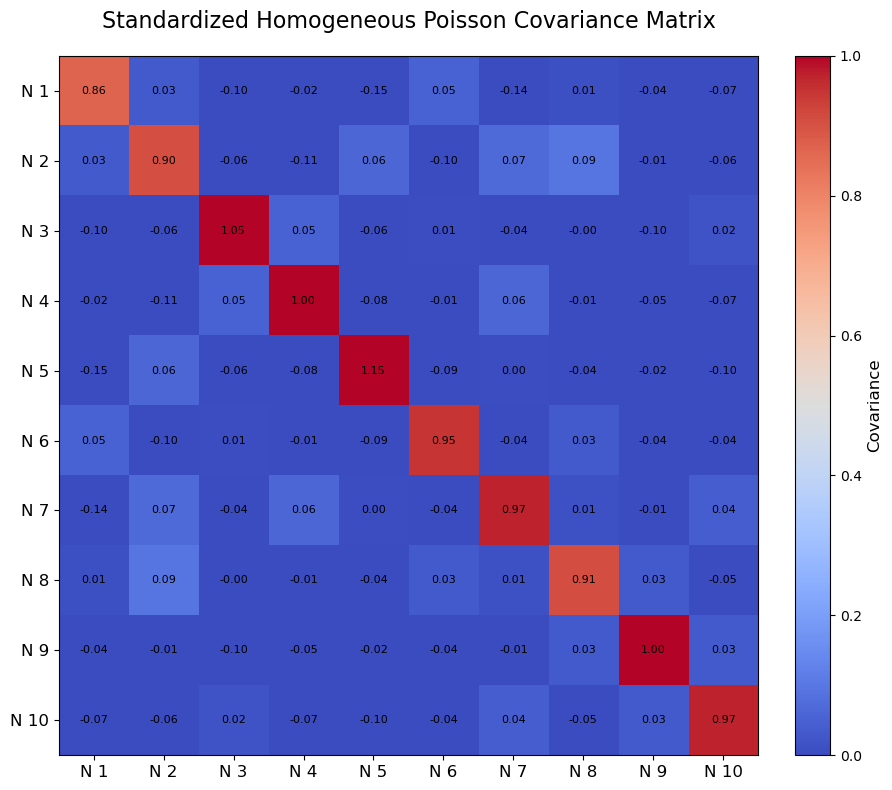

In [84]:
plot_covariance_matrix(cov_matrix, normalize=False, title='Standardized Homogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 8.68351101e-01,  3.26999898e-02, -1.05196634e-01,
        -1.83685450e-02, -1.54286895e-01,  5.21914218e-02,
        -1.40511897e-01,  9.37719190e-03, -3.61304059e-02,
        -6.98594913e-02],
       [ 3.26999898e-02,  9.00808089e-01, -6.01321796e-02,
        -1.12630901e-01,  6.05803098e-02, -1.00854310e-01,
         6.38722404e-02,  9.29221520e-02, -4.85880681e-03,
        -6.27968929e-02],
       [-1.05196634e-01, -6.01321796e-02,  1.07105712e+00,
         5.67839131e-02, -6.24603374e-02,  9.02919068e-03,
        -4.20664570e-02, -1.15204680e-04, -1.03465544e-01,
         1.87938030e-02],
       [-1.83685450e-02, -1.12630901e-01,  5.67839131e-02,
         9.75520942e-01, -7.35635133e-02, -8.77270080e-03,
         5.93254977e-02, -9.53853571e-03, -5.36833289e-02,
        -7.02223374e-02],
       [-1.54286895e-01,  6.05803098e-02, -6.24603374e-02,
        -7.35635133e-02,  1.15960166e+00, -9.05493149e-02,
         6.27742085e-03, -4.40243942e-02, -2.49478201e-02,
        -1.

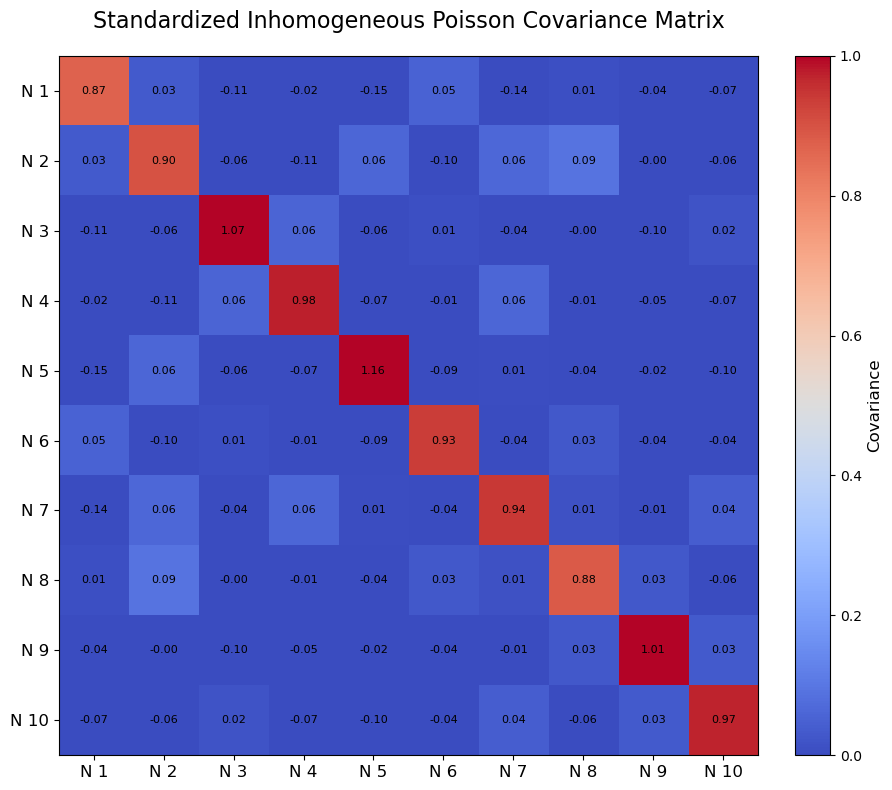

In [85]:
plot_covariance_matrix(cov_matrix_emp, normalize=False, title='Standardized Inhomogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 0.90623841,  0.00136911, -0.12617283,  0.05227167,  0.01984371,
         0.01897233,  0.00680454, -0.13182992, -0.05645498, -0.0990762 ],
       [ 0.00136911,  1.08171189, -0.02819195, -0.02773141,  0.0396913 ,
         0.07948463, -0.0253604 ,  0.05607792,  0.06745835, -0.05644753],
       [-0.12617283, -0.02819195,  0.95437323, -0.07841949, -0.09154453,
         0.16866301,  0.01431074,  0.04470267,  0.00237224,  0.03745377],
       [ 0.05227167, -0.02773141, -0.07841949,  0.88942436,  0.02954373,
         0.03413878, -0.01923105,  0.01035026, -0.01206229, -0.03580033],
       [ 0.01984371,  0.0396913 , -0.09154453,  0.02954373,  1.14252862,
        -0.13513968, -0.00840445, -0.03858414, -0.05275275, -0.03918032],
       [ 0.01897233,  0.07948463,  0.16866301,  0.03413878, -0.13513968,
         1.00222752,  0.144808  , -0.0536327 , -0.00288631, -0.03212537],
       [ 0.00680454, -0.0253604 ,  0.01431074, -0.01923105, -0.00840445,
         0.144808  ,  0.86499605,  0.02808812

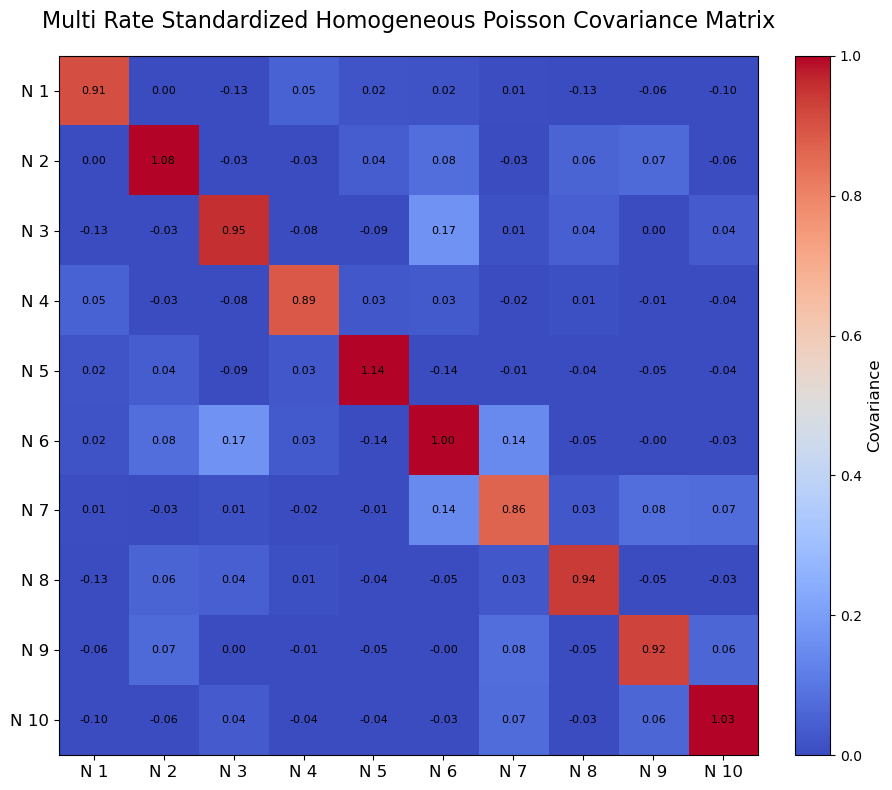

In [86]:
plot_covariance_matrix(multi_rate_cov_matrix, normalize=False, title='Multi Rate Standardized Homogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 9.01639366e-01,  1.21155752e-04, -1.26617971e-01,
         5.24653050e-02,  1.99508132e-02,  1.77726507e-02,
         7.08452952e-03, -1.33036333e-01, -5.58936575e-02,
        -9.78230028e-02],
       [ 1.21155752e-04,  1.04810560e+00, -2.56812016e-02,
        -2.36245312e-02,  4.09976647e-02,  7.21997457e-02,
        -2.45561852e-02,  6.04831113e-02,  6.25338904e-02,
        -5.95592393e-02],
       [-1.26617971e-01, -2.56812016e-02,  9.42826223e-01,
        -8.11294791e-02, -9.25170486e-02,  1.67411726e-01,
         1.39494126e-02,  4.39087408e-02,  3.99584141e-03,
         3.75942669e-02],
       [ 5.24653050e-02, -2.36245312e-02, -8.11294791e-02,
         8.87895339e-01,  2.97391163e-02,  3.73010519e-02,
        -2.00533288e-02,  6.92570259e-03, -1.09747740e-02,
        -3.10667520e-02],
       [ 1.99508132e-02,  4.09976647e-02, -9.25170486e-02,
         2.97391163e-02,  1.14595363e+00, -1.33803967e-01,
        -8.25790785e-03, -3.98924532e-02, -5.13680183e-02,
        -3.

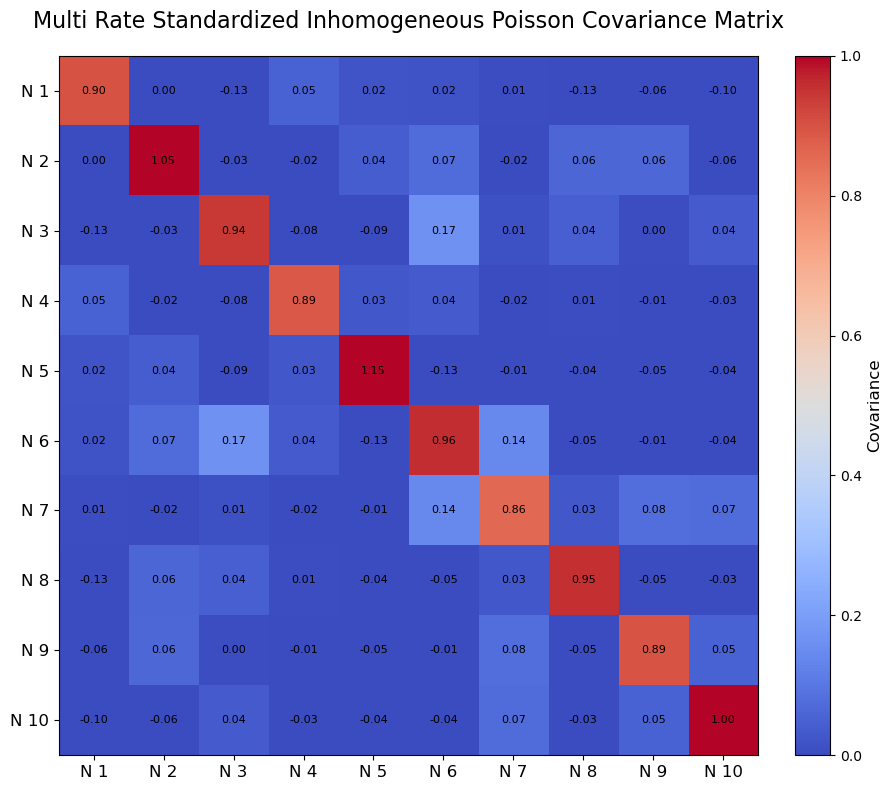

In [87]:
plot_covariance_matrix(multi_rate_cov_matrix_emp, normalize=False, title='Multi Rate Standardized Inhomogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 0.92350992,  0.10096755,  0.03082936, -0.03224788, -0.13247296,
        -0.13381005,  0.04365192,  0.0218646 ,  0.01805084, -0.0248414 ],
       [ 0.10096755,  0.92236787, -0.02581213, -0.01239061, -0.16527032,
        -0.0895089 , -0.08691562,  0.01362908,  0.11696789,  0.08822735],
       [ 0.03082936, -0.02581213,  0.85125747, -0.00302471, -0.08058808,
         0.06510096,  0.03022278,  0.00969834,  0.00676509, -0.09213603],
       [-0.03224788, -0.01239061, -0.00302471,  0.94886386,  0.09295386,
        -0.01701696,  0.00831768, -0.01718924, -0.02668068, -0.03964116],
       [-0.13247296, -0.16527032, -0.08058808,  0.09295386,  1.05506754,
         0.08446993,  0.12152832,  0.01062349, -0.03441677, -0.05868415],
       [-0.13381005, -0.0895089 ,  0.06510096, -0.01701696,  0.08446993,
         0.95758553,  0.0369187 ,  0.0023408 , -0.09777084, -0.06686641],
       [ 0.04365192, -0.08691562,  0.03022278,  0.00831768,  0.12152832,
         0.0369187 ,  0.94174863, -0.01048067

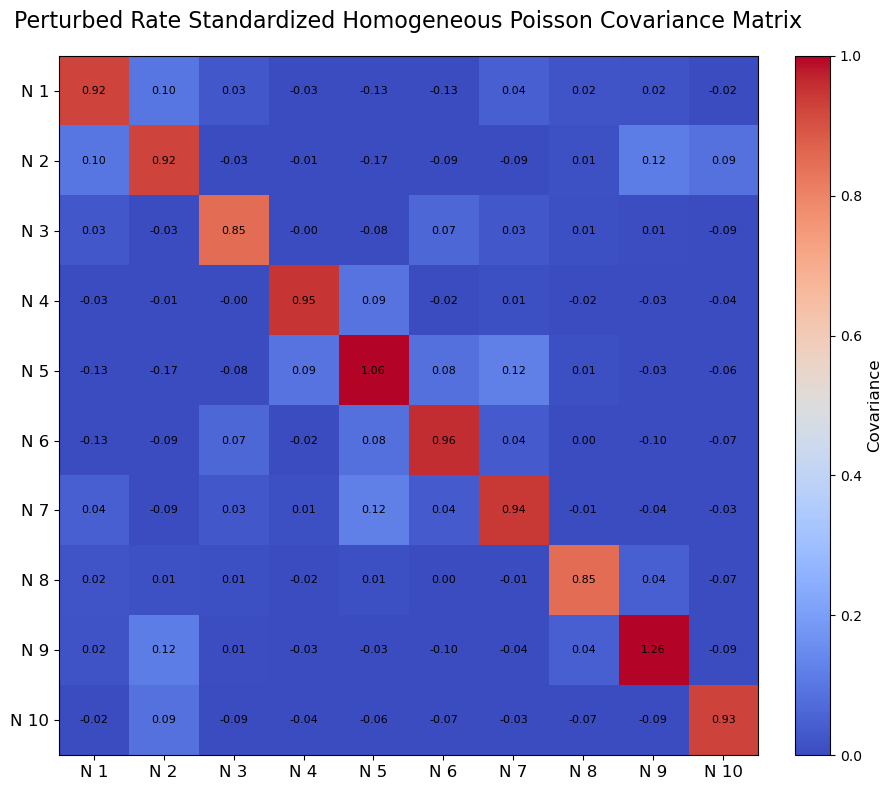

In [88]:
plot_covariance_matrix(perturbed_rate_cov_matrix, normalize=False, title='Perturbed Rate Standardized Homogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 0.90982715,  0.10101614,  0.02959139, -0.03363705, -0.13121679,
        -0.13144676,  0.04490375,  0.02498291,  0.01441808, -0.02439551],
       [ 0.10101614,  0.93824629, -0.02701933, -0.0119666 , -0.1664407 ,
        -0.09091979, -0.0861972 ,  0.01472629,  0.1179371 ,  0.0882409 ],
       [ 0.02959139, -0.02701933,  0.85257869, -0.00558725, -0.08084818,
         0.06633118,  0.03111644,  0.00980513,  0.0054289 , -0.09278068],
       [-0.03363705, -0.0119666 , -0.00558725,  0.94389846,  0.09369251,
        -0.01673618,  0.00929092, -0.01674624, -0.02441419, -0.04182207],
       [-0.13121679, -0.1664407 , -0.08084818,  0.09369251,  1.05716388,
         0.08340439,  0.12159949,  0.00685753, -0.02801564, -0.05988814],
       [-0.13144676, -0.09091979,  0.06633118, -0.01673618,  0.08340439,
         0.97374382,  0.03494089, -0.00351519, -0.08828545, -0.06803829],
       [ 0.04490375, -0.0861972 ,  0.03111644,  0.00929092,  0.12159949,
         0.03494089,  0.93742376, -0.01274199

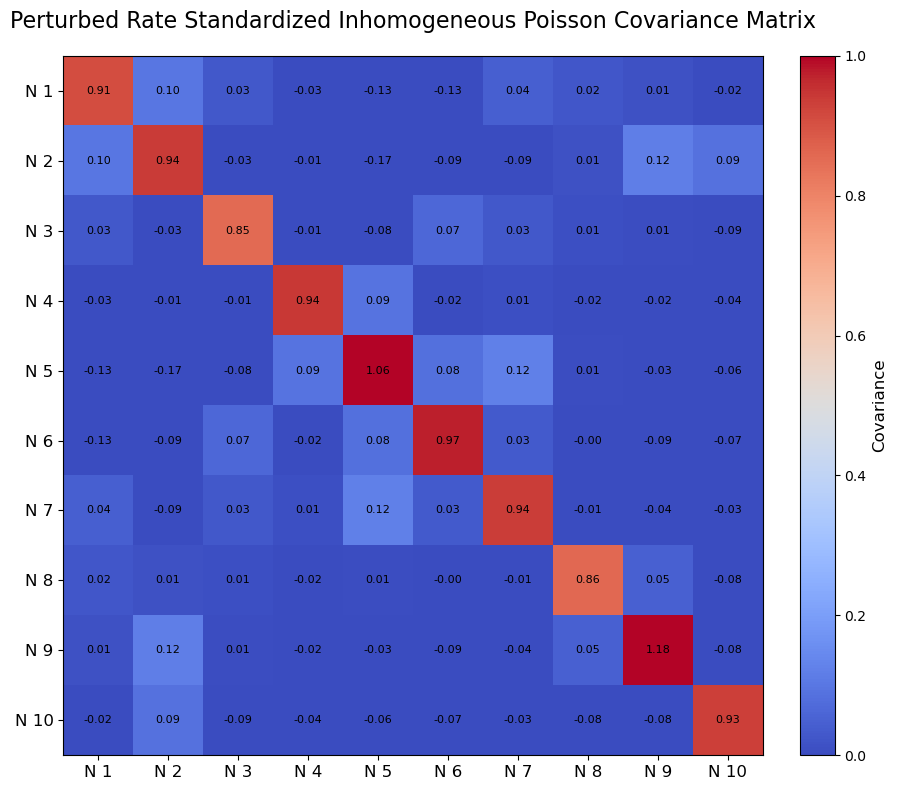

In [89]:
plot_covariance_matrix(perturbed_rate_cov_matrix_emp, normalize=False, title='Perturbed Rate Standardized Inhomogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

In [90]:
#### TESTING END #####

In [91]:
#hotelling_result = hotelling_t2_test(reshaped_stands, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result)
#hotelling_result_emp = hotelling_t2_test(reshaped_stands_emp, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_emp)

In [92]:
#good_result = stats.goodness_of_fit(stats.norm, serialized_count, statistic='ad', n_mc_samples=9999, rng=None)
# Anderson-Darling test (good for normality)
# Number of Monte Carlo samples
# Random number generator (None for fresh results)

#print(f"Statistic: {good_result.statistic}")
#print(f"P-value: {good_result.pvalue}")
#print(f"Location (mean): {good_result.fit_result.params.loc}")
#print(f"Scale (std dev): {good_result.fit_result.params.scale}")

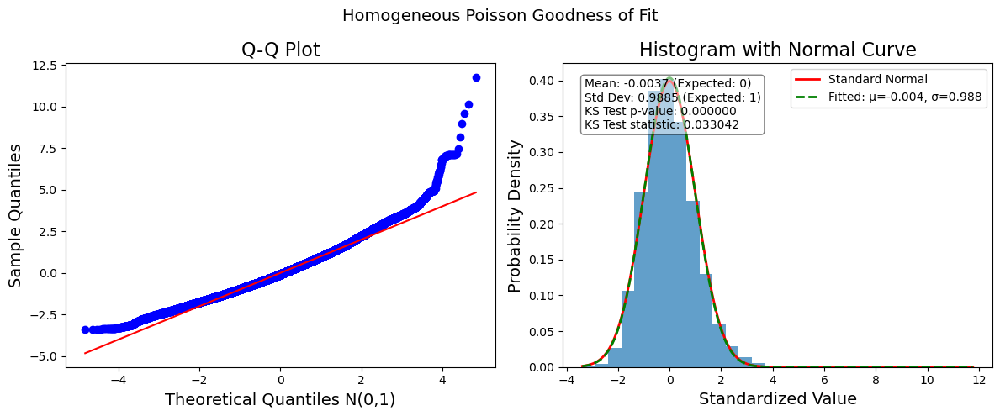

In [93]:
goodness, fig = analyze_poisson_goodness_of_fit(serialized_count, plot_title="Homogeneous Poisson Goodness of Fit", sample_limit=5000)

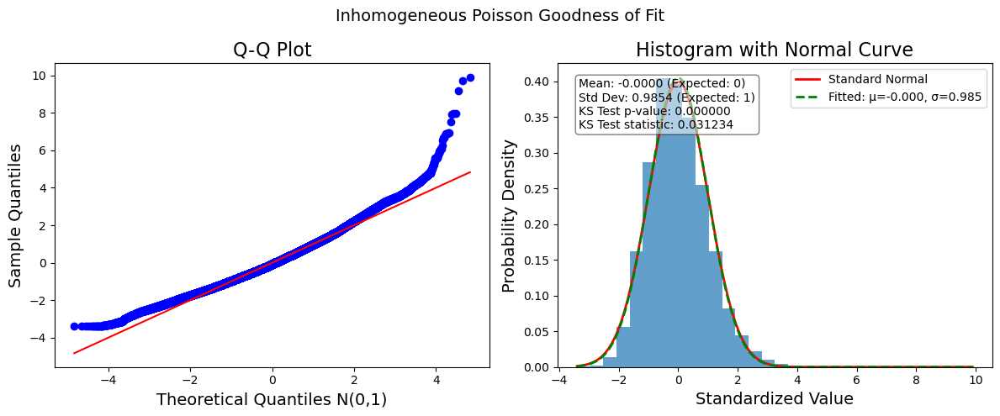

In [94]:
goodness_emp, fig_emp = analyze_poisson_goodness_of_fit(serialized_count_emp, plot_title="Inhomogeneous Poisson Goodness of Fit", sample_limit=5000)

In [95]:
# MULTIVARIATE ANALYSIS
# rv = multivariate_normal(mean=mean, cov=cov, allow_singular=allow_singular)
#rv = multivariate_normal(mean = [0,0], cov = cov_matrix, allow_singular = False)
#rv_emp = multivariate_normal(mean = [0,0], cov = cov_matrix_emp, allow_singular=False)
#print(rv)
#print(rv_emp)

# this is creating its own model, from this we can test if the data has goodness of fit

In [96]:
#cov_matrix, diagonal_ones = covariance_diagonal(reshaped_stands, tol=1e-8)
#print(cov_matrix)
#print(diagonal_ones)
#cov_matrix_emp, diagonal_ones_emp = covariance_diagonal(reshaped_stands_emp, tol=1e-8)
#print(cov_matrix_emp)
#print(diagonal_ones_emp)

In [97]:
#normal_loglikelihood = compute_neural_multivariate_log_likelihood(reshaped_stands)
#print(normal_loglikelihood)

#normal_loglikelihood_emp = compute_neural_multivariate_log_likelihood(reshaped_stands_emp)
#print(normal_loglikelihood_emp)

LogLikelihood experiments, Chi Square statistics, T tests, and zscores

In [99]:
total_log_likelihood, log_likelihood_per_sample = log_likelihood(empirical_mean, theoretical_means)
print(total_log_likelihood)
print(log_likelihood_per_sample)
# normalize data first (so we don't have any negative values, then we can do log likelihood)

#The neural spike patterns that are observed are unlikely to have come from the model...I got around -1600 log likelihood...

-19383.12313324292
[-1945.87766818 -1934.04378474 -1928.13870324 -1961.60370739
 -1943.36602375 -1929.67927545 -1931.5755359  -1927.49851144
 -1956.4616062  -1924.87831695]


In [100]:
test_total_log_likelihood, test_log_likelihood_per_sample = log_likelihood(theoretical_means, theoretical_means)
print(test_total_log_likelihood)
print(test_log_likelihood_per_sample)
# Note: This log likelihood has relative entropy

-19357.73383911487
[-1947.4009939  -1931.80620539 -1936.17406581 -1948.34485033
 -1947.63712637 -1923.44938257 -1918.21658969 -1919.21757744
 -1959.07209665 -1926.41495095]


In [101]:
multivar_log_likelihood, multivar_log_likelihood_per_sample = multivariate_log_likelihood(reshaped_stands)
print(multivar_log_likelihood)
print(multivar_log_likelihood_per_sample)
len(multivar_log_likelihood_per_sample)

# note, there are 99900 samples and the total sum of those is very large.
#print(multivar_log_likelihood/len(multivar_log_likelihood_per_sample))

-1394247.694647181
[ -9.09116119  -9.22583359  -9.36050599 ... -15.53362883 -15.53515079
 -15.53693932]


99900

In [102]:
multivar_log_likelihood_emp, multivar_log_likelihood_per_sample_emp = multivariate_log_likelihood(reshaped_stands_emp)
print(multivar_log_likelihood_emp)
print(multivar_log_likelihood_per_sample_emp)
len(multivar_log_likelihood_per_sample)

-1389353.6975112294
[ -9.25898216  -9.39104608  -9.50519374 ... -15.49852493 -15.51639277
 -15.51784891]


99900

In [103]:
# difference between multivariate log likelihood of expected - observed data.
diff = multivar_log_likelihood_emp - multivar_log_likelihood
print(diff)

print(diff/len(multivar_log_likelihood_per_sample)) # small difference per sample, less than 1.

4893.997135951649
0.04898896031983633


In [104]:
reshaped_stands_resized, reshaped_stands_emp_resized = match_array_shapes(reshaped_stands, reshaped_stands_emp)
# resized makes sure that the standardized observed and expected data are the same shape

Original shapes: (10, 99900) and (10, 99800)
Trimmed both to shape: (10, 99800)
Final shapes: (10, 99800) and (10, 99800)


In [105]:
### Chi square test can have bins and minimum expected input by the user ###
### bins (resolution): more bins show a detailed comparison, fewer bins show a broader comparison ###
### min_expected: check used to empty bins with less than min_expected counts
### 50 bins is considered a moderate resolution, 5 minimum expected counts per bin

In [106]:
proper_chi_square_test(reshaped_stands_resized, reshaped_stands_emp_resized, n_bins=30, min_expected=5)
# 'chi_square_statistic': 244.68781663684993
# 'p_value': 4.777468454985577e-40 (aka statistically significant p < 0.05)
# 'degrees_of_freedom': 21, (22 - 1 = 21)
# 'bins_created': 30
# 'bins_used': 22
# 'bins_removed': 8 (too few expected counts)
# The frequency distributions of observed and expected standardized data are different

{'chi_square_statistic': 295.45304135195295,
 'p_value': 1.708127015708645e-51,
 'degrees_of_freedom': 19,
 'bins_created': 30,
 'bins_used': 20,
 'bins_removed': 10}

In [107]:
### T test can have 'one_sample', 'two_sample', or 'paired' test type ###

In [108]:
t_test(reshaped_stands_resized, reshaped_stands_emp_resized, test_type='one_sample', target_mean=0)
# 't_statistic': 2.9680692646417373
# 'p_value': 0.00299683895859134
# 'target_mean': 0.0
# 'sample_mean': 0.003010765946416713

## estimated standardized data compared with the estimated mean.

{'t_statistic': -3.65750935380107,
 'p_value': 0.00025469105293360035,
 'test_type': 'one_sample_vs_mean',
 'target_mean': 0.0,
 'sample_mean': -0.003617744930269985}

In [109]:
t_test(reshaped_stands_emp_resized, reshaped_stands_emp_resized, test_type='one_sample', target_mean=0)
# 't_statistic': 9.031514925174204e-16
# 'p_value': 0.9999999999999993
# 'target_mean': 0.0
# ''sample_mean': 9.10405106879808e-19

## observed standardized data compared with the known mean.

{'t_statistic': 3.695530361103447e-15,
 'p_value': 0.9999999999999971,
 'test_type': 'one_sample_vs_mean',
 'target_mean': 0.0,
 'sample_mean': 3.6452693457832794e-18}

In [110]:
### Z stat info ###
data_flat = reshaped_stands_emp.flatten()
n = len(data_flat)

sample_std = np.std(data_flat, ddof=1)
std_error = sample_std / np.sqrt(n)
std_error

np.float64(0.00098639951227321)

In [111]:
# z_stat = (sample_mean - population_mean) / std_error
Zstat = (np.mean(reshaped_stands_emp) - 0)/std_error
Zstat

np.float64(3.695530361103447e-15)

In [112]:
t_test(reshaped_stands_resized, reshaped_stands_emp_resized, test_type='two_sample', target_mean=None)
# Are the group means different?
# 't_statistic': 2.1053251974447873
# 'p_value': 0.03526313467995148 (aka statistically significant p < 0.05)
# The datasets have significantly different means

{'t_statistic': -2.5898191855850152,
 'p_value': 0.009602705236265868,
 'test_type': 'two_sample'}

In [113]:
t_test(reshaped_stands_resized, reshaped_stands_emp_resized, test_type='paired', target_mean=None)
# Are the paired differences different from zero
# 't_statistic': 36.627117732234396
# 'p_value': 1.6617750264560706e-293 (aka statistically significant p < 0.05)
# The datasets have significantly paired differences

{'t_statistic': -7.2095970385303945,
 'p_value': 5.615713622776318e-13,
 'test_type': 'paired'}

Theoretical and Empirical stats of excitatory counts.

In [115]:
# empirical_mean_ex = empirical_means(count_ex)
empirical_mean_ex = count_ex.mean(axis=0)
#print(empirical_mean_ex)
#print(empirical_mean_ex.shape)
count_rate_ex = empirical_mean_ex[:, -1]

# empirical_std_dev_ex = std_dev_empirical_mean(empirical_mean_ex, num_samples, count_ex)
#empirical_std_dev_ex = count_ex.std(axis=0, ddof=1)
empirical_std_dev_ex = np.sqrt(empirical_mean_ex)
#print(empirical_std_dev_ex)
#print(empirical_std_dev_ex.shape)

empirical_lower_bound_ex, empirical_upper_bound_ex = confidence_intervals(empirical_mean_ex, empirical_std_dev_ex, num_samples, confidence_level=0.95)
# print(empirical_lower_bound_sim_ex)
# print(empirical_upper_bound_sim_ex)

In [116]:
exclude_times_ex, global_exclude_ex = last_zero_std_time(empirical_std_dev_ex, verbose=True)

Neuron 0: last zero std at t=-1, recommended exclude=0
Neuron 1: last zero std at t=-1, recommended exclude=0
Neuron 2: last zero std at t=-1, recommended exclude=0
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=-1, recommended exclude=0
Neuron 6: last zero std at t=0, recommended exclude=1
Neuron 7: last zero std at t=0, recommended exclude=1
Neuron 8: last zero std at t=-1, recommended exclude=0
Neuron 9: last zero std at t=-1, recommended exclude=0

Global exclude (safest): t=1


In [117]:
theoretical_means_sim_ex = calculate_theoretical_mean(count_rate_ex, time)
#print(theoretical_means_sim_ex)
#print(theoretical_means_sim_ex.shape)

theoretical_std_dev_sim_ex = calculate_theoretical_std_dev(theoretical_means_sim_ex)
#print(theoretical_std_dev_sim_ex)
#print(theoretical_std_dev_sim_ex.shape)

theoretical_lower_bound_sim_ex, theoretical_upper_bound_sim_ex = confidence_intervals(theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples, confidence_level=0.95)
# print(theoretical_lower_bound_sim_ex)
# print(theoretical_upper_bound_sim_ex)

In [118]:
res_var_ex = variance_of_residuals(empirical_mean_ex, theoretical_means_sim_ex)
#print(res_var_ex)

In [119]:
stands_ex = standardize_counts_loop(count_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples, num_neurons, exclude = 1)
#print(stands_ex)
#print(stands_ex.shape)

stands_ex_emp = standardize_counts_loop(count_ex, empirical_mean_ex, empirical_std_dev_ex, num_samples, num_neurons, global_exclude_ex)
#print(stands_ex_emp)
#print(stands_ex_emp.shape)

# WHENEVER WE CHANGE TIME, WE NEED TO HAVE IT BE KNOWN, 

# when i do covariance, i should reshape from num_samples, num_neurons, , assume poisson but not assume independent, the variance and covariance should be equal
# time to something with time as replicate. replicate (num_samples) times time in dimension, num_neurons
# covariance, num_neurons by num_neurons, data to produce this should be num_samples times num_neurons
# reformat the current matrix, use reshape with the matrix, maybe with loops 

standardized_mean_global_ex = np.mean(stands_ex)
standardized_std_global_ex = np.std(stands_ex)

standardized_mean_emp_global_ex = np.mean(stands_ex_emp)
standardized_std_emp_global_ex = np.std(stands_ex_emp)

standardized_mean_ex = np.mean(stands_ex, axis=0)
standardized_std_ex = np.std(stands_ex, axis=0, ddof = 1)

standardized_mean_ex_emp = np.mean(stands_ex_emp, axis = 0)
standardized_std_ex_emp = np.std(stands_ex_emp, axis = 0, ddof = 1)

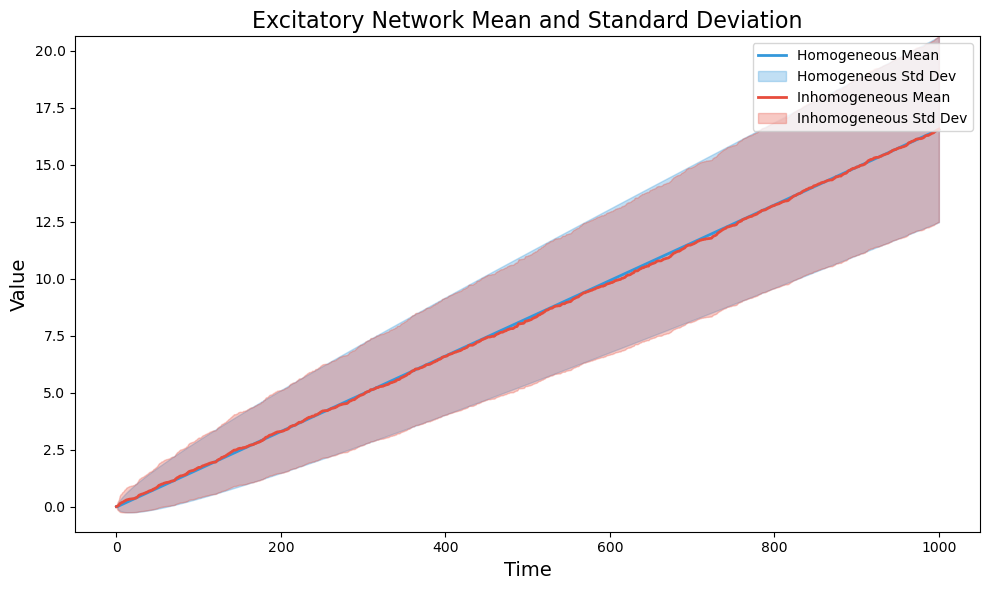

In [120]:
plot_stats(theoretical_means_sim_ex, empirical_mean_ex, theoretical_std_dev_sim_ex, empirical_std_dev_ex, title = 'Excitatory Network Mean and Standard Deviation')

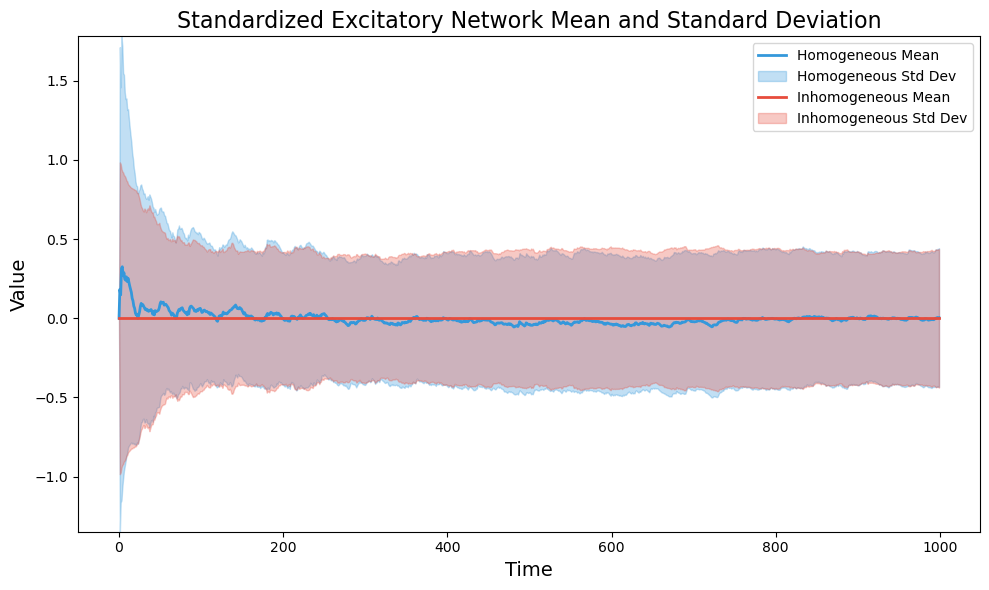

In [121]:
plot_stats(standardized_mean_ex, standardized_mean_ex_emp, standardized_std_ex, standardized_std_ex_emp, title = 'Standardized Excitatory Network Mean and Standard Deviation')

In [122]:
mean_check_ex = check_mean_with_se(stands_ex, expected_mean=0, confidence=0.95)
#print(mean_check_ex)

mean_check_ex_emp = check_mean_with_se(stands_ex_emp, expected_mean=0, confidence=0.95)
#print(mean_check_ex_emp)

In [123]:
serialized_count_ex = serialize_counts(stands_ex) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_ex.shape)
#print(np.mean(serialized_count_ex))
t_stat_ex, p_val_mean_ex = stats.ttest_1samp(serialized_count_ex, np.mean(serialized_count_ex))
#print(t_stat_ex)
#print(p_val_mean_ex)

    ## per neuron, check that is it doing per neuron
    ## check assumptions if i'm using count, check for data replicate and check for variables

serialized_count_ex_emp = serialize_counts(stands_ex_emp) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_ex_emp.shape)
#print(np.mean(serialized_count_ex_emp))
t_stat_ex_emp, p_val_mean_ex_emp = stats.ttest_1samp(serialized_count_ex_emp, np.mean(serialized_count_ex_emp))
#print(t_stat_ex_emp)
#print(p_val_mean_ex_emp)

In [124]:
#reshaped_stands_ex = np.reshape(stands_ex, (-1, stands_ex.shape[1]), order='F')
reshaped_stands_ex = np.transpose(stands_ex, (1, 0, 2)).reshape(stands_ex.shape[1], -1)
#print(stands_ex.shape)
#print(reshaped_stands_ex.shape)

#could change the values from num_samples, num_neurons, time to 10 by large number, could transpose it
# make sure coviariance matrix is using row data, don't use np.cov because it throws away the mean
# covariance is the data and the transpose of the data divided sqrt(n-1), lookup how covariance is calculated and make it by hand.
# try to iterate over samples, as in each time point, 

# reshaped_stands_ex_emp = np.reshape(stands_ex_emp, (-1, stands_ex_emp.shape[1]), order='F')
reshaped_stands_ex_emp = np.transpose(stands_ex_emp, (1, 0, 2)).reshape(stands_ex_emp.shape[1], -1)
#print(stands_ex_emp.shape)
#print(stands_ex.shape)
#print(reshaped_stands_ex.shape)
#print(stands_ex[:,:,0])
#print(reshaped_stands[:,0])
#print(stands_ex_emp[:,:,0].shape)
#print(stands_ex_emp[:10,:,0])
#print(reshaped_stands_ex_emp.shape)
#print(reshaped_stands_ex_emp[:10,:])

In [125]:
transpose_stands_ex = np.transpose(stands_ex, (1, 0, 2))
#print(transpose_stands_ex[:,:,0:3])

In [126]:
#print(reshaped_stands_ex[:,:5])

In [127]:
#print("Time point 0:", stands_ex[:,:,0])
#print("Time point 1:", stands_ex[:,:,1])
#print("Time point 100:", stands_ex[:,:,100])

In [128]:
cov_matrix_ex = cov_standardized_data(reshaped_stands_ex)
cov_matrix_ex_emp = cov_standardized_data(reshaped_stands_ex_emp)

array([[ 0.21517878,  0.04389538,  0.02925316,  0.01229954,  0.03598259,
        -0.00509322,  0.03254516,  0.0176704 ,  0.0291515 ,  0.00866648],
       [ 0.04389538,  0.28258421,  0.03216666,  0.0155809 ,  0.02677402,
         0.02703227,  0.0089213 ,  0.00578514,  0.0260672 , -0.00758324],
       [ 0.02925316,  0.03216666,  0.15462402,  0.03105437,  0.03355844,
         0.02582464,  0.00834771,  0.03544931,  0.03430266,  0.0472305 ],
       [ 0.01229954,  0.0155809 ,  0.03105437,  0.13177719,  0.03140332,
         0.01256485,  0.00469798,  0.03714078,  0.03333076,  0.04167203],
       [ 0.03598259,  0.02677402,  0.03355844,  0.03140332,  0.14996117,
         0.01323485,  0.01789852,  0.02709865,  0.0534395 ,  0.02914923],
       [-0.00509322,  0.02703227,  0.02582464,  0.01256485,  0.01323485,
         0.31986336,  0.00692365,  0.00687377,  0.01116292,  0.00702741],
       [ 0.03254516,  0.0089213 ,  0.00834771,  0.00469798,  0.01789852,
         0.00692365,  0.21029324,  0.02062169

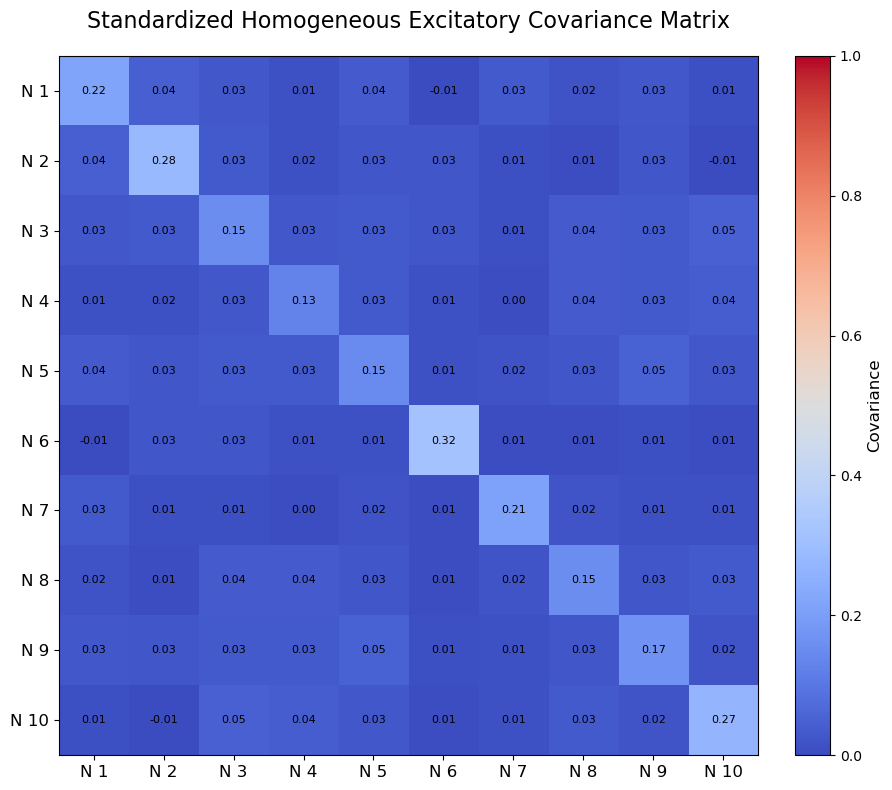

In [129]:
plot_covariance_matrix(cov_matrix_ex, normalize=False, title="Standardized Homogeneous Excitatory Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 0.20229216,  0.04237388,  0.02819064,  0.01066846,  0.03458283,
        -0.00604576,  0.03315478,  0.01694937,  0.02669925,  0.00798218],
       [ 0.04237388,  0.27584965,  0.03140801,  0.01521453,  0.02619827,
         0.02551413,  0.00894881,  0.00521092,  0.02586896, -0.00871701],
       [ 0.02819064,  0.03140801,  0.15226089,  0.03068524,  0.03336647,
         0.02572677,  0.0081431 ,  0.03528308,  0.03415596,  0.04684928],
       [ 0.01066846,  0.01521453,  0.03068524,  0.12835539,  0.0304555 ,
         0.01215605,  0.00527618,  0.03670482,  0.03164792,  0.04142081],
       [ 0.03458283,  0.02619827,  0.03336647,  0.0304555 ,  0.14424046,
         0.01196519,  0.01859271,  0.02660769,  0.05119799,  0.02904448],
       [-0.00604576,  0.02551413,  0.02572677,  0.01215605,  0.01196519,
         0.30123207,  0.00683688,  0.00553984,  0.00852204,  0.00703329],
       [ 0.03315478,  0.00894881,  0.0081431 ,  0.00527618,  0.01859271,
         0.00683688,  0.21613301,  0.02113755

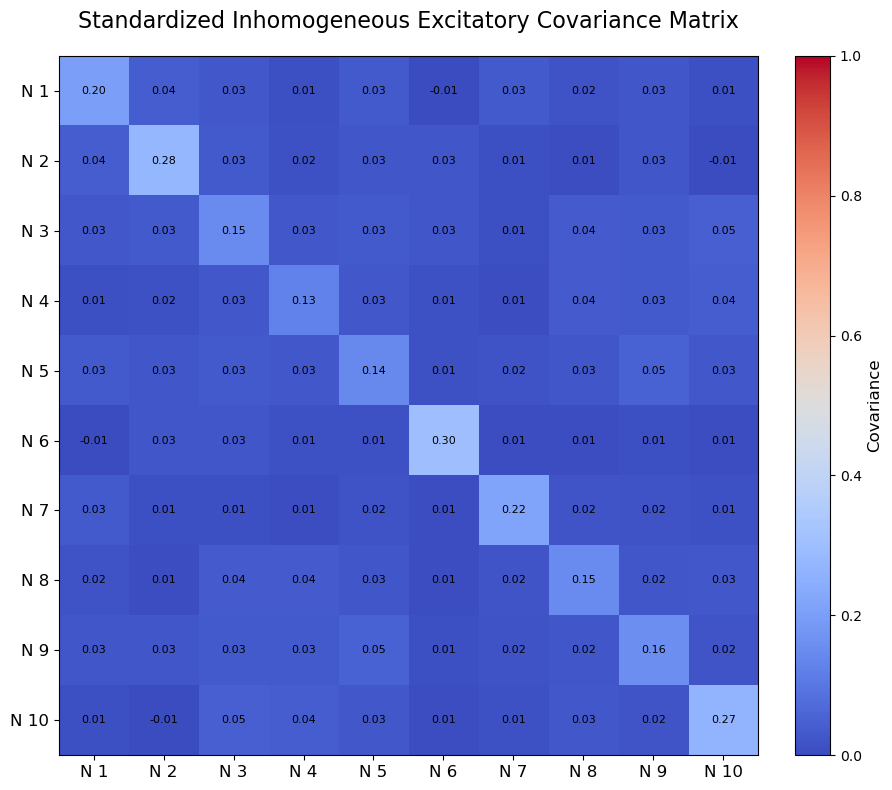

In [130]:
plot_covariance_matrix(cov_matrix_ex_emp, normalize=False, title="Standardized Inhomogeneous Excitatory Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=None)

In [131]:
#hotelling_result_ex = hotelling_t2_test(reshaped_stands_ex, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_ex)
#hotelling_result_ex_emp = hotelling_t2_test(reshaped_stands_ex_emp, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_ex_emp)

In [132]:
#cov_matrix_ex, diagonal_ones_ex = covariance_diagonal(reshaped_stands_ex, tol=1e-8)
#print(cov_matrix_ex)
#print(diagonal_ones_ex)
#cov_matrix_ex_emp, diagonal_ones_ex_emp = covariance_diagonal(reshaped_stands_ex_emp, tol=1e-8)
#print(cov_matrix_ex_emp)
#print(diagonal_ones_ex_emp)

In [133]:
#### TESTING #####
#plot_covariance_matrix(reshaped_data, normalize=False, title="Excitatory Theoretical Covariance Matrix", cmap='coolwarm', annot=True)

In [134]:
#### TESTING ####
#plot_covariance_matrix(reshaped_data_emp, normalize=False, title="Excitatory Empirical Covariance Matrix", cmap='coolwarm', annot=True)

In [135]:
# MULTIVARIATE ANALYSIS
# rv = multivariate_normal(mean=mean, cov=cov, allow_singular=allow_singular)

# rv_ex = multivariate_normal(mean = theoretical_means_sim_ex, cov = cov_matrix_ex, allow_singular=allow_singular)
# rv_ex_emp = multivariate_normal(mean = empirical_mean_ex, cov = cov_matrix_ex_emp, allow_singular=allow_singular)

# this is creating its own model, from this we can test if the data has goodness of fit

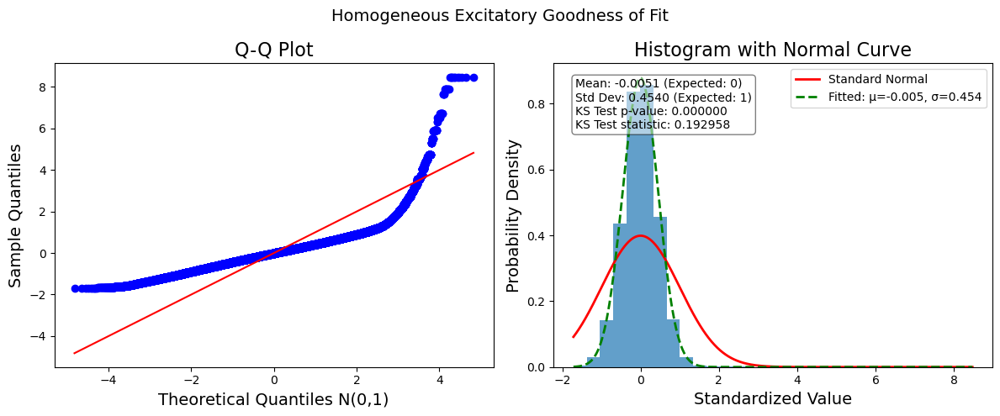

In [136]:
goodness_ex, fig_ex = analyze_poisson_goodness_of_fit(serialized_count_ex, plot_title="Homogeneous Excitatory Goodness of Fit", sample_limit=5000)

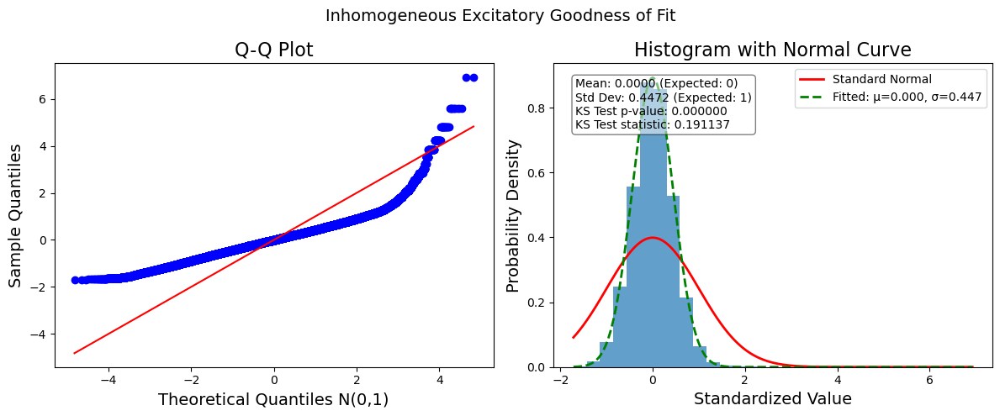

In [137]:
goodness_ex_emp, fig_ex_emp = analyze_poisson_goodness_of_fit(serialized_count_ex_emp, plot_title="Inhomogeneous Excitatory Goodness of Fit", sample_limit=5000)

Theoretical and Empirical stats of inhibitory counts.

In [139]:
# empirical_mean_in = empirical_means(count_in)
empirical_mean_in = count_in.mean(axis=0)
#print(empirical_mean_in)
#print(empirical_mean_in.shape)
count_rate_in = empirical_mean_in[:, -1]

#empirical_std_dev_in = std_dev_empirical_mean(empirical_mean_in, num_samples, count_in)
#empirical_std_dev_in = count_in.std(axis=0, ddof=1)
empirical_std_dev_in = np.sqrt(empirical_mean_in)
#print(empirical_std_dev_in)
#print(empirical_std_dev_in.shape)

empirical_lower_bound_in, empirical_upper_bound_in = confidence_intervals(empirical_mean_in, empirical_std_dev_in, num_samples, confidence_level=0.95)
# print(empirical_lower_bound_sim_in)
# print(empirical_upper_bound_sim_in)

In [140]:
exclude_times_in, global_exclude_in = last_zero_std_time(empirical_std_dev_in, verbose=True)

Neuron 0: last zero std at t=2, recommended exclude=3
Neuron 1: last zero std at t=-1, recommended exclude=0
Neuron 2: last zero std at t=-1, recommended exclude=0
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=-1, recommended exclude=0
Neuron 6: last zero std at t=-1, recommended exclude=0
Neuron 7: last zero std at t=0, recommended exclude=1
Neuron 8: last zero std at t=-1, recommended exclude=0
Neuron 9: last zero std at t=-1, recommended exclude=0

Global exclude (safest): t=3


In [141]:
theoretical_means_sim_in = calculate_theoretical_mean(count_rate_in, time)
#print(theoretical_means_sim_in)
#print(theoretical_means_sim_in.shape)

theoretical_std_dev_sim_in = calculate_theoretical_std_dev(theoretical_means_sim_in)
#print(theoretical_std_dev_sim_in)
#print(theoretical_std_dev_sim_in.shape)

theoretical_lower_bound_sim_in, theoretical_upper_bound_sim_in = confidence_intervals(theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples, confidence_level=0.95)
# print(theoretical_lower_bound_sim_in)
# print(theoretical_upper_bound_sim_in)

In [142]:
res_var_in = variance_of_residuals(empirical_mean_in, theoretical_means_sim_in)
#print(res_var_in)

In [143]:
stands_in = standardize_counts_loop(count_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples, num_neurons, exclude = 1)
#print(stands_in)
#print(stands_in.shape)

stands_in_emp = standardize_counts_loop(count_in, empirical_mean_in, empirical_std_dev_in, num_samples, num_neurons, global_exclude_in)
#print(stands_in_emp)
#print(stands_in_emp.shape)

# WHENEVER WE CHANGE TIME, WE NEED TO HAVE IT BE KNOWN, 

# when i do covariance, i should reshape from num_samples, num_neurons, , assume poisson but not assume independent, the variance and covariance should be equal
# time to something with time as replicate. replicate (num_samples) times time in dimension, num_neurons
# covariance, num_neurons by num_neurons, data to produce this should be num_samples times num_neurons
# reformat the current matrix, use reshape with the matrix, maybe with loops 

standardized_mean_global_in = np.mean(stands_in)
standardized_std_global_in = np.std(stands_in)

standardized_mean_emp_global_in = np.mean(stands_in_emp)
standardized_std_emp_global_in = np.std(stands_in_emp)

standardized_mean_in = np.mean(stands_in, axis=0)
standardized_std_in = np.std(stands_in, axis=0, ddof = 1)

standardized_mean_in_emp = np.mean(stands_in_emp, axis = 0)
standardized_std_in_emp = np.std(stands_in_emp, axis = 0, ddof = 1)

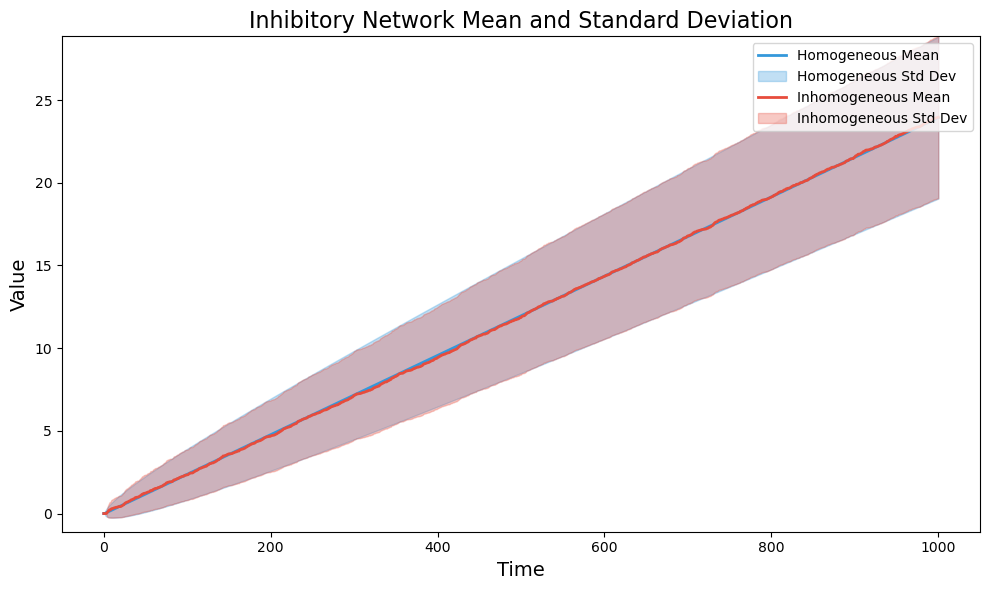

In [144]:
plot_stats(theoretical_means_sim_in , empirical_mean_in, theoretical_std_dev_sim_in, empirical_std_dev_in, title = 'Inhibitory Network Mean and Standard Deviation')

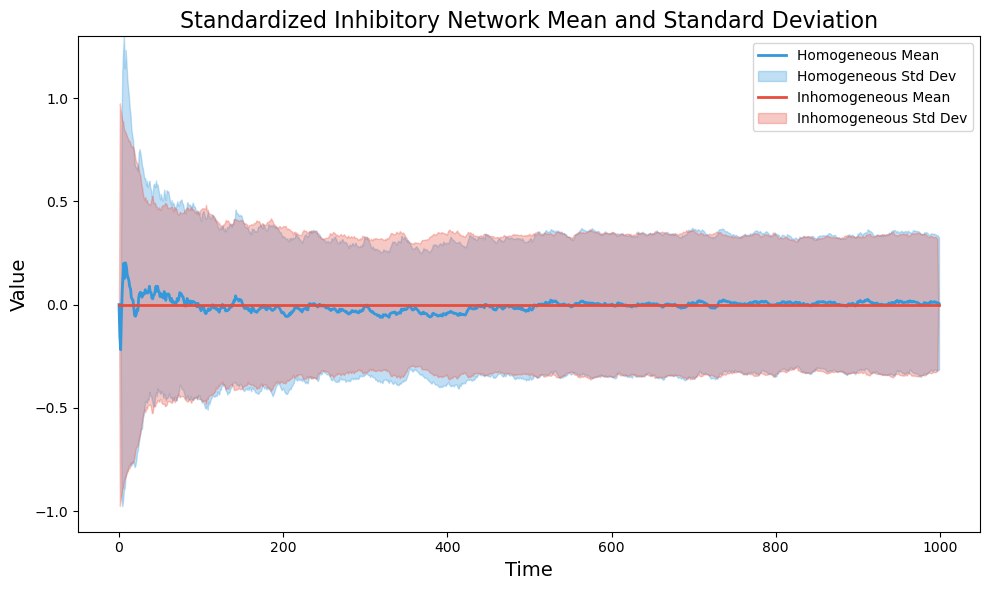

In [145]:
plot_stats(standardized_mean_in, standardized_mean_in_emp, standardized_std_in, standardized_std_in_emp, title = 'Standardized Inhibitory Network Mean and Standard Deviation')

In [146]:
mean_check_in = check_mean_with_se(stands_in, expected_mean=0, confidence=0.95)
#print(mean_check_in)

mean_check_in_emp = check_mean_with_se(stands_in_emp, expected_mean=0, confidence=0.95)
#print(mean_check_in_emp)

In [147]:
serialized_count_in = serialize_counts(stands_in) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_in.shape)
#print(np.mean(serialized_count_in))
t_stat_in, p_val_mean_in = stats.ttest_1samp(serialized_count_in, np.mean(serialized_count_in))
#print(t_stat_in)
#print(p_val_mean_in)
    ## per neuron, check that is it doing per neuron
    ## check assumptions if i'm using count, check for data replicate and check for variables


serialized_count_in_emp = serialize_counts(stands_in_emp) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_in_emp.shape)
#print(np.mean(serialized_count_in_emp))
t_stat_in_emp, p_val_mean_in_emp = stats.ttest_1samp(serialized_count_in_emp, np.mean(serialized_count_in_emp))
#print(t_stat_in_emp)
#print(p_val_mean_in_emp)

In [148]:
#reshaped_stands_in = np.reshape(stands_in, (-1, stands_in.shape[1]), order='F')
reshaped_stands_in = np.transpose(stands_in, (1, 0, 2)).reshape(stands_in.shape[1], -1)
#print(stands_in.shape)
#print(reshaped_stands_in.shape)

#reshaped_stands_in_emp = np.reshape(stands_in_emp, (-1, stands_in_emp.shape[1]), order='F')
reshaped_stands_in_emp = np.transpose(stands_in_emp, (1, 0, 2)).reshape(stands_in_emp.shape[1], -1)
#print(stands_in_emp.shape)
#print(reshaped_stands_in_emp.shape)

In [149]:
cov_matrix_in = cov_standardized_data(reshaped_stands_in)
cov_matrix_in_emp = cov_standardized_data(reshaped_stands_in_emp)

array([[ 1.41801732e-01,  1.77785863e-02,  7.10425714e-03,
         2.01489453e-02,  3.89117179e-02,  1.61813089e-02,
         2.06212268e-02,  3.54603890e-02,  3.01722264e-02,
         3.80310562e-02],
       [ 1.77785863e-02,  1.24658872e-01,  2.07583999e-02,
         2.45301675e-02,  1.10244708e-02,  2.25705935e-02,
        -2.87720918e-03,  1.68350099e-02,  2.83516172e-02,
         2.03748329e-02],
       [ 7.10425714e-03,  2.07583999e-02,  1.85841313e-01,
         4.35192393e-02,  8.94027819e-03,  3.08121851e-02,
         4.67506945e-02,  2.51117553e-02,  3.47445797e-02,
         3.57857972e-02],
       [ 2.01489453e-02,  2.45301675e-02,  4.35192393e-02,
         1.52823991e-01,  2.05914341e-02,  4.43648210e-02,
         3.17692875e-02,  3.53818139e-02,  3.17457758e-02,
         3.24141741e-04],
       [ 3.89117179e-02,  1.10244708e-02,  8.94027819e-03,
         2.05914341e-02,  1.53621080e-01,  2.19295878e-02,
         7.80814665e-03,  1.48023547e-02,  3.41101317e-02,
         1.

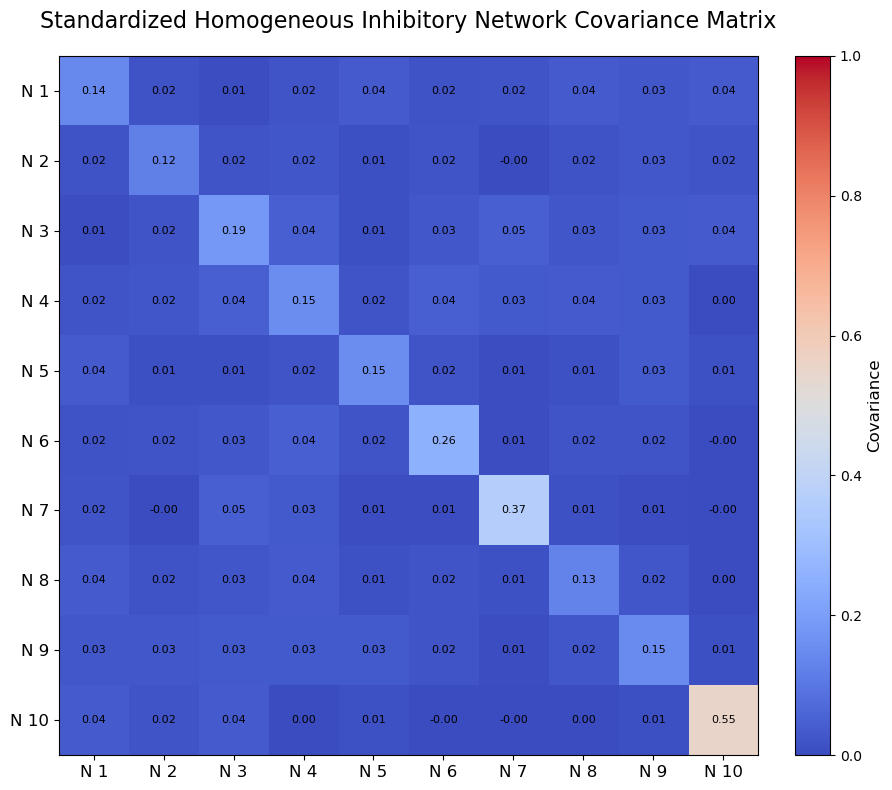

In [150]:
plot_covariance_matrix(cov_matrix_in, normalize=False, title="Standardized Homogeneous Inhibitory Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 0.1387081 ,  0.01752538,  0.00630582,  0.01995328,  0.03869116,
         0.01590221,  0.01965448,  0.03528942,  0.03006854,  0.03704606],
       [ 0.01752538,  0.11960042,  0.02207106,  0.02528275,  0.01072392,
         0.02314952, -0.00167628,  0.01619397,  0.02855563,  0.0177612 ],
       [ 0.00630582,  0.02207106,  0.18381582,  0.04257701,  0.00954536,
         0.0291135 ,  0.0447853 ,  0.02623152,  0.03429371,  0.03548259],
       [ 0.01995328,  0.02528275,  0.04257701,  0.15096665,  0.02101322,
         0.04364194,  0.03087179,  0.03612374,  0.03172092,  0.00141768],
       [ 0.03869116,  0.01072392,  0.00954536,  0.02101322,  0.14912791,
         0.02257885,  0.00725162,  0.01454688,  0.03417189,  0.01271473],
       [ 0.01590221,  0.02314952,  0.0291135 ,  0.04364194,  0.02257885,
         0.24707203,  0.00519782,  0.0200252 ,  0.02229781, -0.00379545],
       [ 0.01965448, -0.00167628,  0.0447853 ,  0.03087179,  0.00725162,
         0.00519782,  0.36817549,  0.01360249

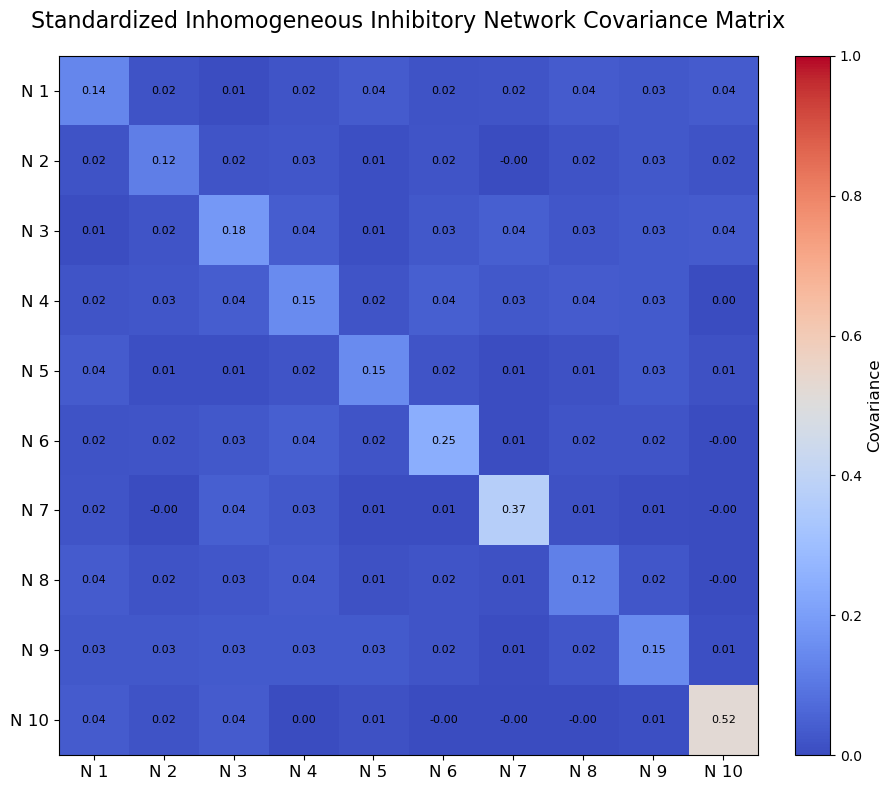

In [151]:
plot_covariance_matrix(cov_matrix_in_emp, normalize=False, title="Standardized Inhomogeneous Inhibitory Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=None)

In [152]:
#hotelling_result_in = hotelling_t2_test(reshaped_stands_in, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_in)
#hotelling_result_in_emp = hotelling_t2_test(reshaped_stands_in_emp, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_in_emp)

In [153]:
#cov_matrix_in, diagonal_ones_in = covariance_diagonal(reshaped_stands_in, tol=1e-8)
#print(cov_matrix_in)
#print(diagonal_ones_in)
#cov_matrix_in_emp, diagonal_ones_in_emp = covariance_diagonal(reshaped_stands_in_emp, tol=1e-8)
#print(cov_matrix_in_emp)
#print(diagonal_ones_in_emp)

In [154]:
# MULTIVARIATE ANALYSIS
# rv = multivariate_normal(mean=mean, cov=cov, allow_singular=allow_singular)

# rv_in = multivariate_normal(mean = theoretical_means_sim_in, cov = cov_matrix_in, allow_singular=allow_singular)
# rv_in_emp = multivariate_normal(mean = empirical_mean_in, cov = cov_matrix_in_emp, allow_singular=allow_singular)

# this is creating its own model, from this we can test if the data has goodness of fit

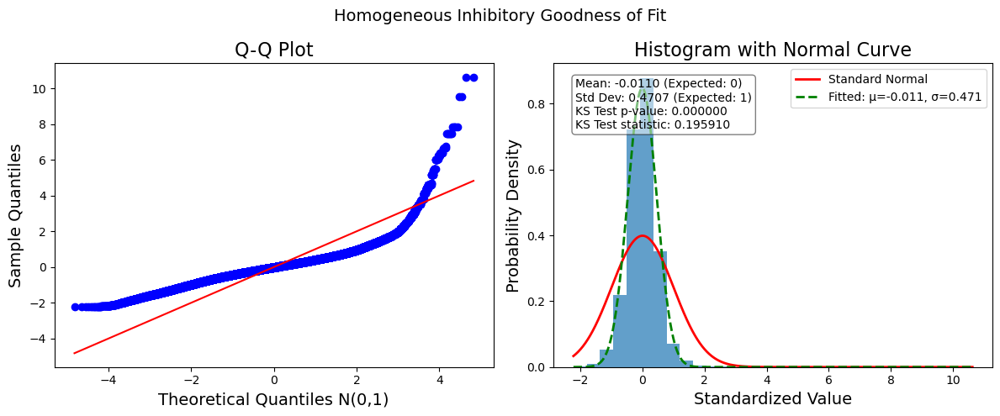

In [155]:
goodness_in, fig_in = analyze_poisson_goodness_of_fit(serialized_count_in, plot_title="Homogeneous Inhibitory Goodness of Fit", sample_limit=5000)

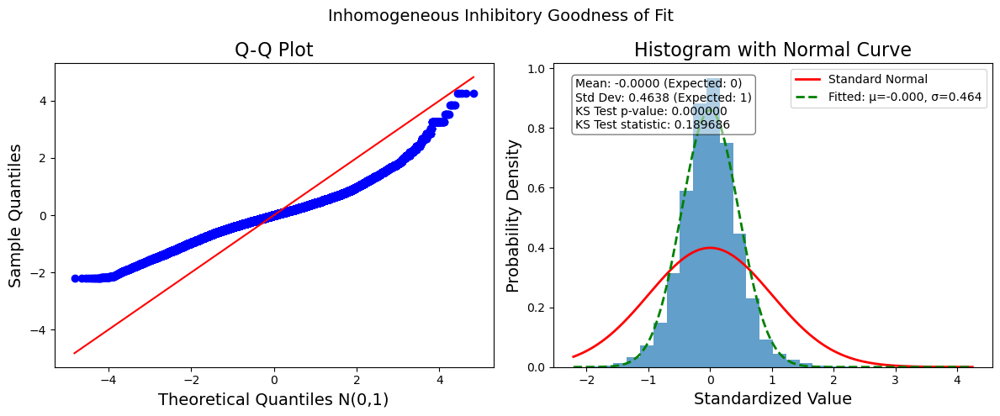

In [156]:
goodness_in_emp, fig_in_emp = analyze_poisson_goodness_of_fit(serialized_count_in_emp, plot_title="Inhomogeneous Inhibitory Goodness of Fit", sample_limit=5000)

Balanced Excitatory and Inhibitory Experiments

In [158]:
# Original excitatory and inhibitory data shapes
print(reshaped_stands_ex.shape)
print(reshaped_stands_in.shape)

print(reshaped_stands_ex_emp.shape)
print(reshaped_stands_in_emp.shape)

(10, 99900)
(10, 99900)
(10, 99900)
(10, 99700)


In [159]:
balanced_data, labels, types = create_balanced_ei_dataset(reshaped_stands_ex, reshaped_stands_in, n_neurons_each=5)
print(f"\nBalanced dataset shape: {balanced_data.shape}")
print(f"Neuron labels: {labels}")
print(f"Neuron types: {types}")

balanced_data_emp, labels_emp, types_emp = create_balanced_ei_dataset(reshaped_stands_ex_emp, reshaped_stands_in_emp, n_neurons_each=5)
print(f"\nBalanced Empirical dataset shape: {balanced_data_emp.shape}")
print(f"Neuron Empirical labels: {labels_emp}")
print(f"Neuron Empirical types: {types_emp}")
# Balanced = Joint, don't use balance because it could be interpreted as something it isn't
# add option to randomize joint excitatory and inhibitory neurons
# Get neuron id from spike train instead of label


Balanced dataset shape: (10, 99900)
Neuron labels: ['E0', 'E1', 'E2', 'E3', 'E4', 'I0', 'I1', 'I2', 'I3', 'I4']
Neuron types: ['E', 'E', 'E', 'E', 'E', 'I', 'I', 'I', 'I', 'I']

Balanced Empirical dataset shape: (10, 99700)
Neuron Empirical labels: ['E0', 'E1', 'E2', 'E3', 'E4', 'I0', 'I1', 'I2', 'I3', 'I4']
Neuron Empirical types: ['E', 'E', 'E', 'E', 'E', 'I', 'I', 'I', 'I', 'I']


In [160]:
cov_matrix_balance = cov_standardized_data(balanced_data)
cov_matrix_balance_emp = cov_standardized_data(balanced_data_emp)

array([[0.21517878, 0.04389538, 0.02925316, 0.01229954, 0.03598259,
        0.02410795, 0.00901504, 0.03733367, 0.02192033, 0.00780213],
       [0.04389538, 0.28258421, 0.03216666, 0.0155809 , 0.02677402,
        0.01132823, 0.03256646, 0.03974546, 0.00924114, 0.02255044],
       [0.02925316, 0.03216666, 0.15462402, 0.03105437, 0.03355844,
        0.01610116, 0.01119563, 0.01741772, 0.03624976, 0.00083306],
       [0.01229954, 0.0155809 , 0.03105437, 0.13177719, 0.03140332,
        0.02215571, 0.02135468, 0.00834274, 0.03347152, 0.0212854 ],
       [0.03598259, 0.02677402, 0.03355844, 0.03140332, 0.14996117,
        0.03123955, 0.02273765, 0.02726664, 0.03483327, 0.03602939],
       [0.02410795, 0.01132823, 0.01610116, 0.02215571, 0.03123955,
        0.14180173, 0.01777859, 0.00710426, 0.02014895, 0.03891172],
       [0.00901504, 0.03256646, 0.01119563, 0.02135468, 0.02273765,
        0.01777859, 0.12465887, 0.0207584 , 0.02453017, 0.01102447],
       [0.03733367, 0.03974546, 0.0174177

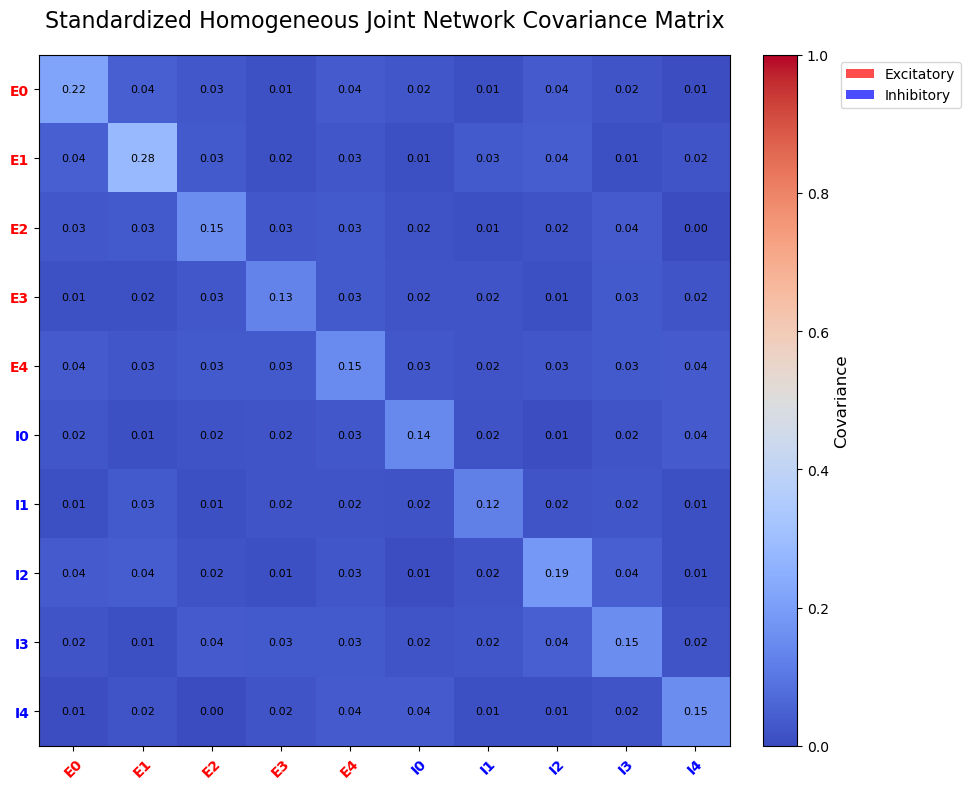

In [161]:
plot_covariance_matrix(cov_matrix_balance, normalize=False, title="Standardized Homogeneous Joint Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=labels)

array([[ 0.20202479,  0.04167244,  0.02791852,  0.01033267,  0.03430344,
         0.01599903,  0.00441947,  0.02148696,  0.01500167, -0.00249612],
       [ 0.04167244,  0.27546236,  0.03108754,  0.01482897,  0.02584178,
        -0.00308053,  0.01846023,  0.02059823,  0.00761984,  0.01277814],
       [ 0.02791852,  0.03108754,  0.15239573,  0.03057015,  0.03325635,
         0.00714187,  0.00771274,  0.00831112,  0.02306045, -0.00514844],
       [ 0.01033267,  0.01482897,  0.03057015,  0.12841033,  0.03033035,
         0.0077707 ,  0.01025236, -0.00117277,  0.02471256,  0.01178423],
       [ 0.03430344,  0.02584178,  0.03325635,  0.03033035,  0.14433738,
         0.01922478,  0.01587864,  0.01569876,  0.02219607,  0.02611262],
       [ 0.01599903, -0.00308053,  0.00714187,  0.0077707 ,  0.01922478,
         0.1387081 ,  0.01752538,  0.00630582,  0.01995328,  0.03869116],
       [ 0.00441947,  0.01846023,  0.00771274,  0.01025236,  0.01587864,
         0.01752538,  0.11960042,  0.02207106

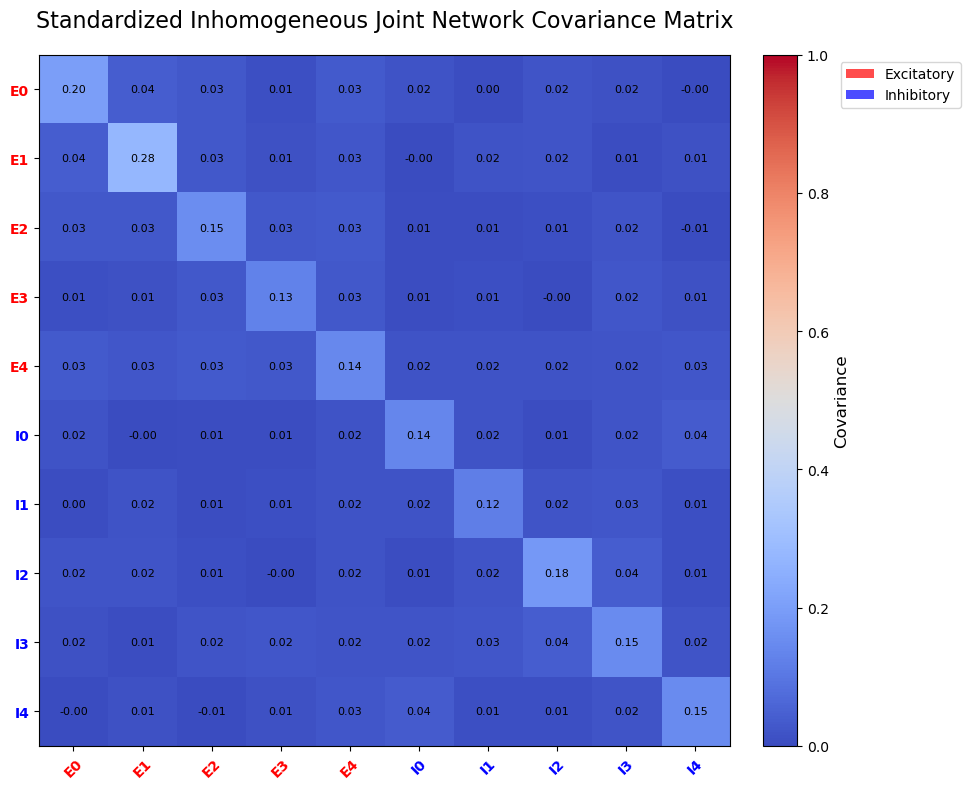

In [162]:
plot_covariance_matrix(cov_matrix_balance_emp, normalize=False, title="Standardized Inhomogeneous Joint Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=labels_emp)

In [163]:
#interleaved_data, int_labels, int_types = create_interleaved_ei_dataset(reshaped_stands_ex, reshaped_stands_in, n_neurons_each=5)
#print(f"\nInterleaved dataset shape: {interleaved_data.shape}")
#print(f"Neuron labels: {int_labels}")
#print(f"Neuron types: {int_types}")

#interleaved_data_emp, int_labels_emp, int_types_emp = create_interleaved_ei_dataset(reshaped_stands_ex_emp, reshaped_stands_in_emp, n_neurons_each=5)
#print(f"\nInterleaved Empirical dataset shape: {interleaved_data_emp.shape}")
#print(f"Neuron Empirical labels: {int_labels_emp}")
#print(f"Neuron Empirical types: {int_types_emp}")

In [164]:
#cov_matrix_interleaved = cov_standardized_data(interleaved_data)
#cov_matrix_interleaved_emp = cov_standardized_data(interleaved_data_emp)

In [165]:
#plot_covariance_matrix(cov_matrix_interleaved, normalize=False, title="Standardized Homogeneous Interleaved Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=int_labels)

In [166]:
#plot_covariance_matrix(cov_matrix_interleaved_emp, normalize=False, title="Standardized Inhomogeneous Interleaved Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=int_labels_emp)

In [167]:
#random_data, rand_labels, rand_types = create_random_ei_dataset(reshaped_stands_ex, reshaped_stands_in, n_neurons_each=5)
#print(f"\nRandom dataset shape: {random_data.shape}")
#print(f"Neuron labels: {rand_labels}")
#print(f"Neuron types: {rand_types}")

#random_data_emp, rand_labels_emp, rand_types_emp = create_random_ei_dataset(reshaped_stands_ex_emp, reshaped_stands_in_emp, n_neurons_each=5)
#print(f"\nRandom Empirical dataset shape: {random_data_emp.shape}")
#print(f"Neuron Empirical labels: {rand_labels_emp}")
#print(f"Neuron Empirical types: {rand_types_emp}")

In [168]:
#cov_matrix_random = cov_standardized_data(random_data)
#cov_matrix_random_emp = cov_standardized_data(random_data_emp)

In [169]:
#plot_covariance_matrix(cov_matrix_random, normalize=False, title="Standardized Homogeneous Random Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=rand_labels)

In [170]:
#plot_covariance_matrix(cov_matrix_random_emp, normalize=False, title="Standardized Inhomogeneous Random Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=rand_labels_emp)

Plots of raw counts, excitatory counts, and inhibitory counts centered and standardized.

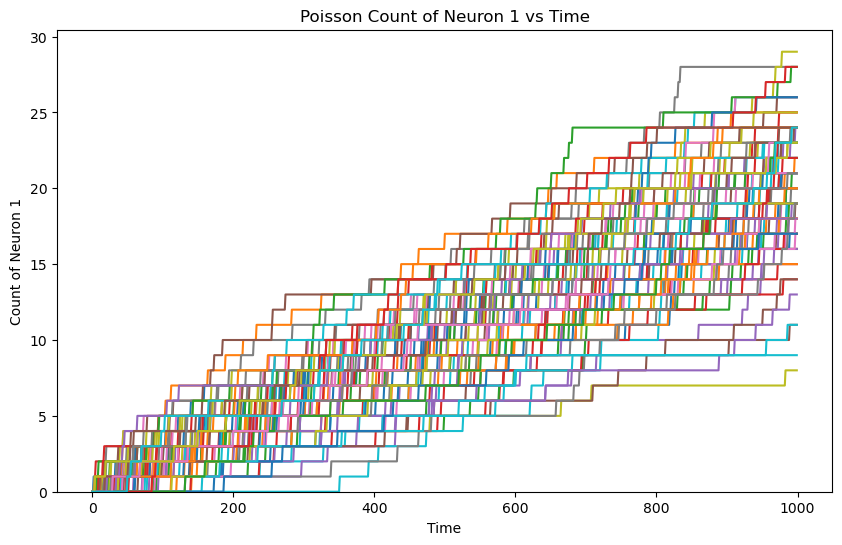

In [172]:
# plot_count_neuron1_vs_time(random_samples, num_samples = 5)
plot_count_neuron1_vs_time(count, num_samples, title = 'Poisson Count of Neuron 1 vs Time')

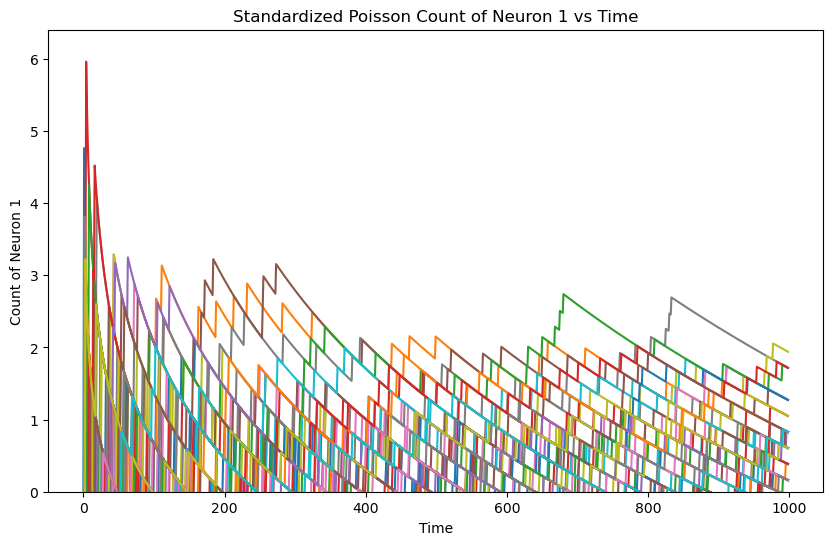

In [173]:
plot_count_neuron1_vs_time(stands, num_samples, title = 'Standardized Poisson Count of Neuron 1 vs Time')

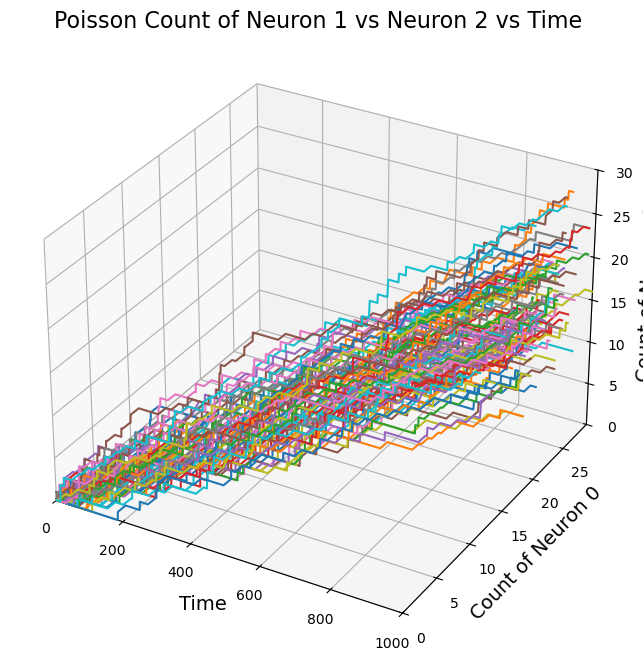

In [174]:
plot_count_neuron1_vs_neuron2_vs_time(count, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Poisson Count of Neuron 1 vs Neuron 2 vs Time' )

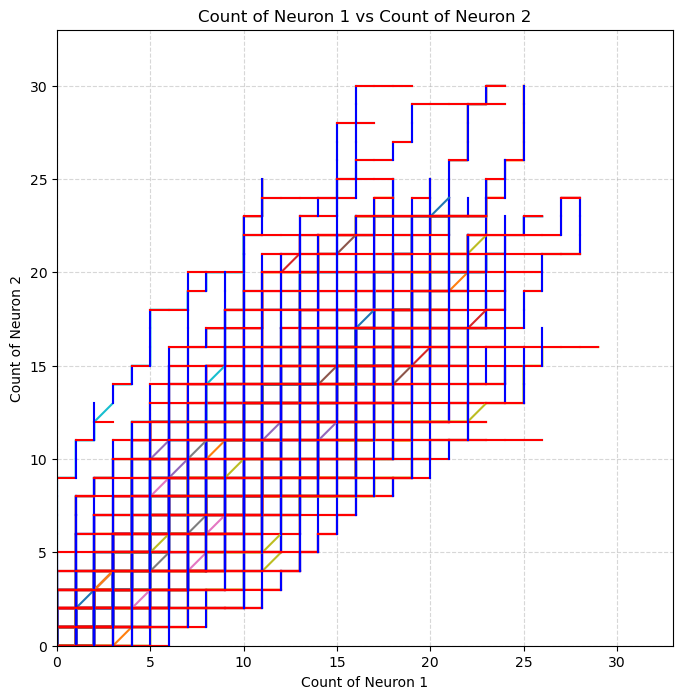

In [175]:
plot_count_neuron1_vs_count_neuron2(count, num_samples)

In [176]:
# plot_count_neuron1_vs_count_neuron2_vs_count_neuron3(count, num_samples)

In [177]:
# combined_poisson_plot(spike_train, count, theoretical_means, empirical_mean, colors=None, figsize=(12, 10))

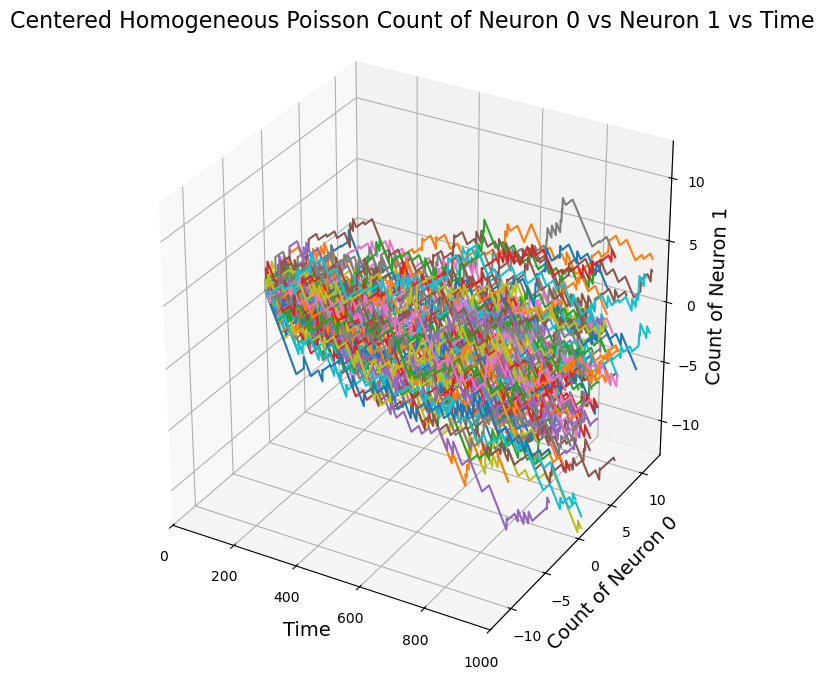

In [178]:
#plot_centered_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, num_samples=5)
plot_centered_staircase_3d(count, theoretical_means, theoretical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Homogeneous Poisson Count of Neuron 0 vs Neuron 1 vs Time' )

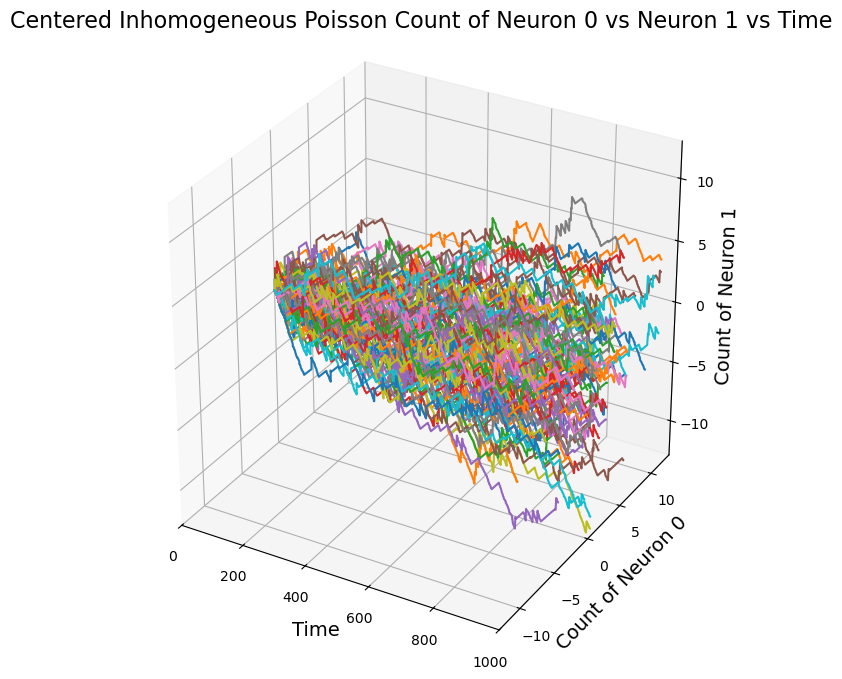

In [179]:
#plot_centered_staircase_3d(random_samples, empirical_mean, empirical_std_dev, num_samples= 5)
plot_centered_staircase_3d(count, empirical_mean, empirical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Inhomogeneous Poisson Count of Neuron 0 vs Neuron 1 vs Time')

WARNING    C:\Users\agreg\neural_simulation_functions.py:345: RuntimeWarning: invalid value encountered in divide
  neuron1_data = (count[i][neuron1_idx] - theoretical_means[neuron1_idx]) / (theoretical_std_dev[neuron1_idx])
 [py.warnings]
WARNING    C:\Users\agreg\neural_simulation_functions.py:346: RuntimeWarning: invalid value encountered in divide
  neuron2_data = (count[i][neuron2_idx] - theoretical_means[neuron2_idx]) / (theoretical_std_dev[neuron2_idx])
 [py.warnings]
WARNING    C:\Users\agreg\neural_simulation_functions.py:346: RuntimeWarning: divide by zero encountered in divide
  neuron2_data = (count[i][neuron2_idx] - theoretical_means[neuron2_idx]) / (theoretical_std_dev[neuron2_idx])
 [py.warnings]


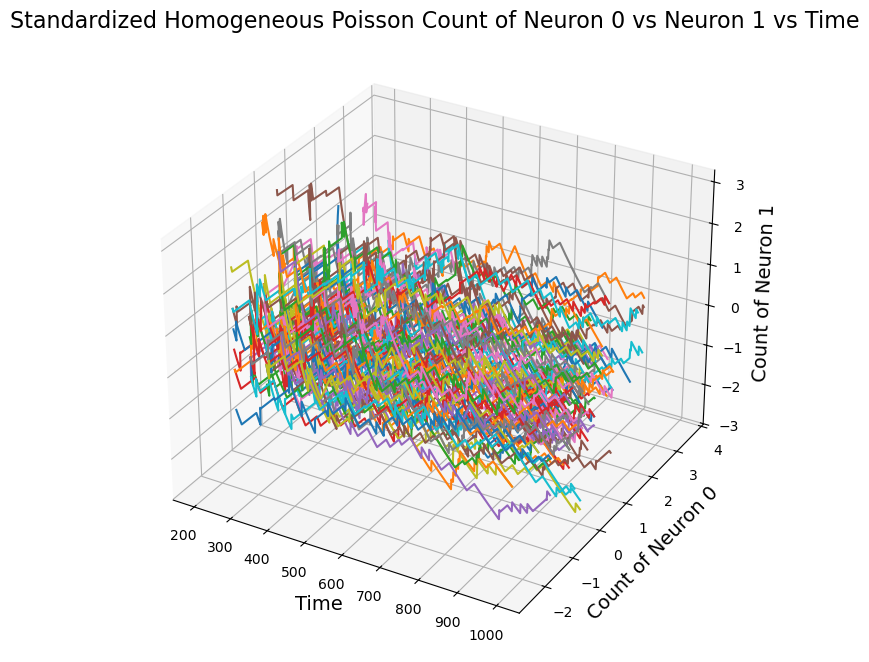

In [180]:
#plot_standardized_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, t0, num_samples=5)
plot_standardized_staircase_3d(count, theoretical_means, theoretical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Homogeneous Poisson Count of Neuron 0 vs Neuron 1 vs Time')

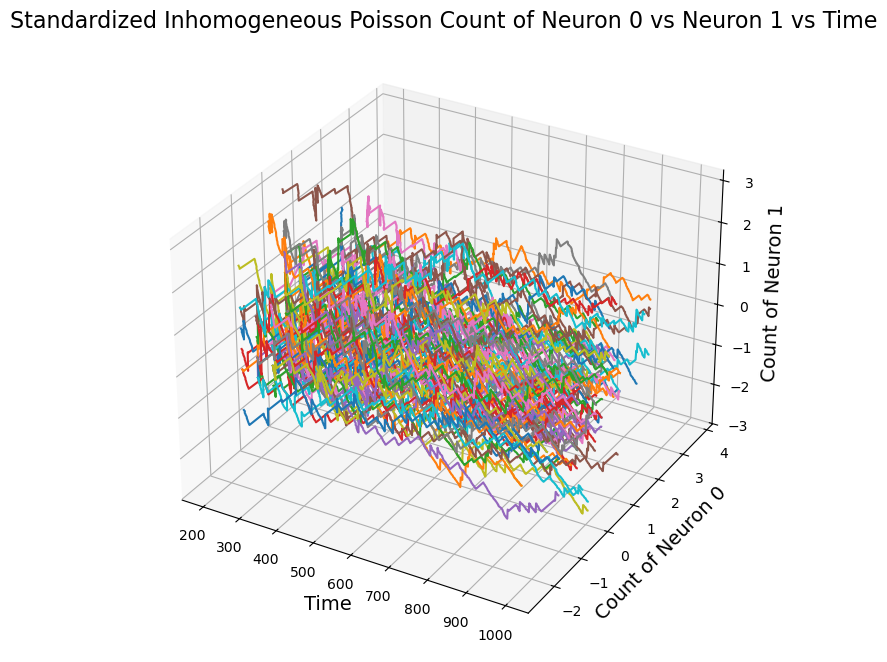

In [181]:
#plot_standardized_staircase_3d(random_samples, empirical_mean, empirical_std_dev, t0, num_samples=5)
plot_standardized_staircase_3d(count, empirical_mean, empirical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Inhomogeneous Poisson Count of Neuron 0 vs Neuron 1 vs Time')

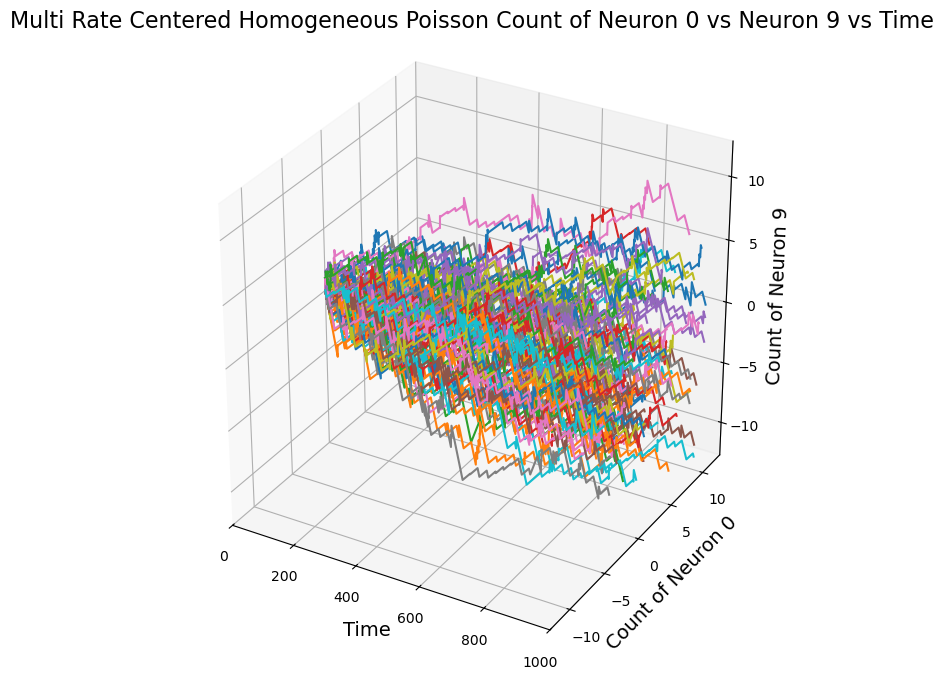

In [182]:
#plot_centered_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, num_samples=5)
plot_centered_staircase_3d(multi_rate_count, multi_rate_theoretical_means, multi_rate_theoretical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Centered Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time' )

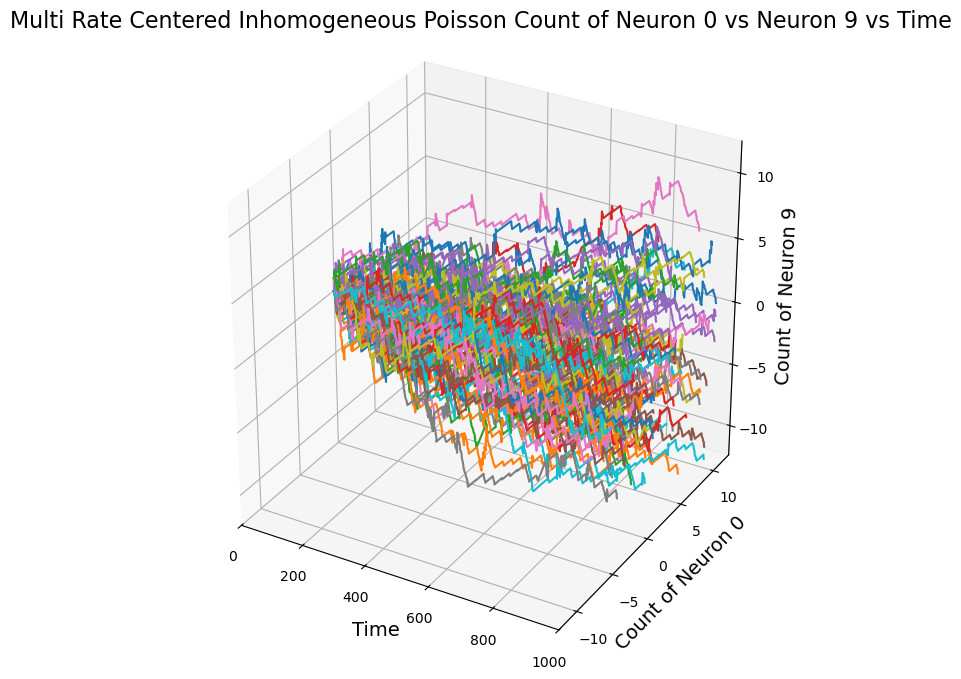

In [183]:
#plot_centered_staircase_3d(random_samples, empirical_mean, empirical_std_dev, num_samples= 5)
plot_centered_staircase_3d(multi_rate_count, multi_rate_empirical_mean, multi_rate_empirical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Centered Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

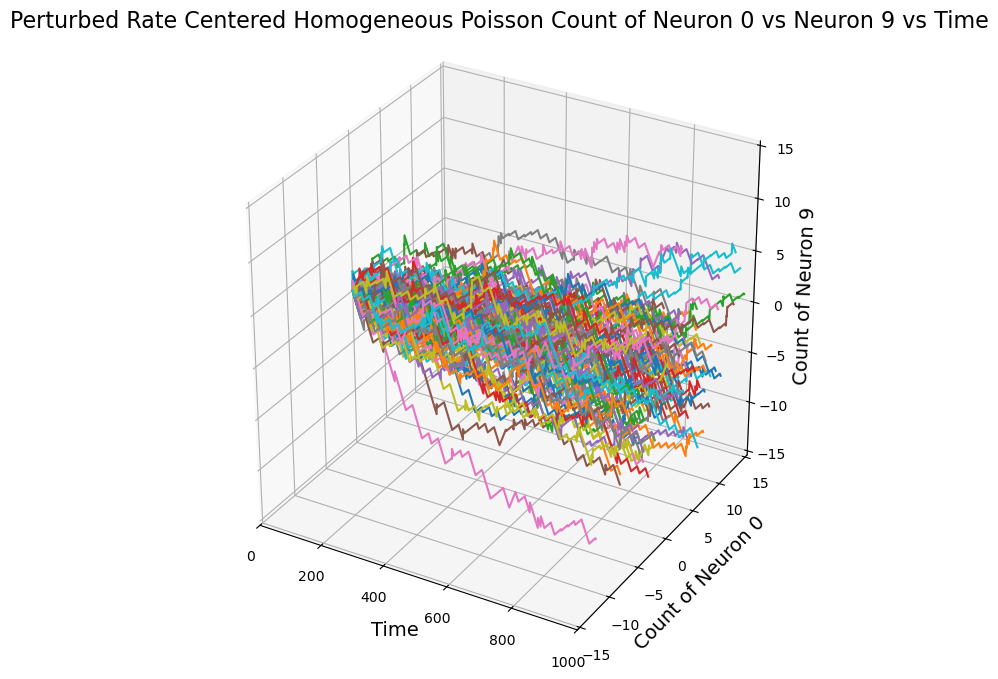

In [184]:
#plot_centered_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, num_samples=5)
plot_centered_staircase_3d(perturbed_rate_count, perturbed_rate_theoretical_means, perturbed_rate_theoretical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Centered Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time' )

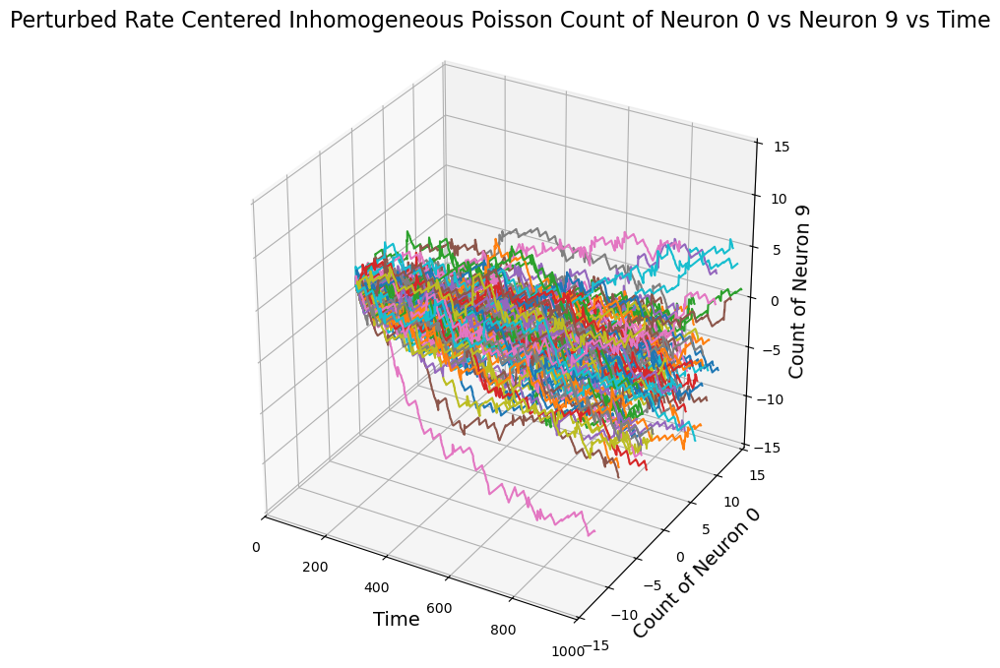

In [185]:
#plot_centered_staircase_3d(random_samples, empirical_mean, empirical_std_dev, num_samples= 5)
plot_centered_staircase_3d(perturbed_rate_count, perturbed_rate_empirical_mean, perturbed_rate_empirical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Centered Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

WARNING    C:\Users\agreg\neural_simulation_functions.py:345: RuntimeWarning: divide by zero encountered in divide
  neuron1_data = (count[i][neuron1_idx] - theoretical_means[neuron1_idx]) / (theoretical_std_dev[neuron1_idx])
 [py.warnings]


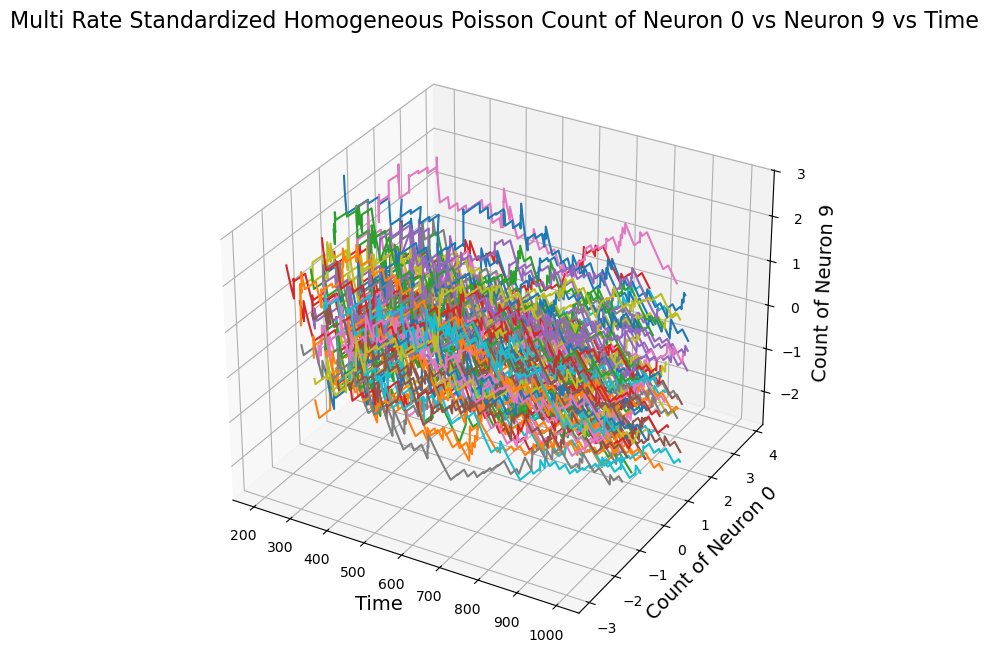

In [186]:
#plot_standardized_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, t0, num_samples=5)
plot_standardized_staircase_3d(multi_rate_count, multi_rate_theoretical_means, multi_rate_theoretical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Standardized Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

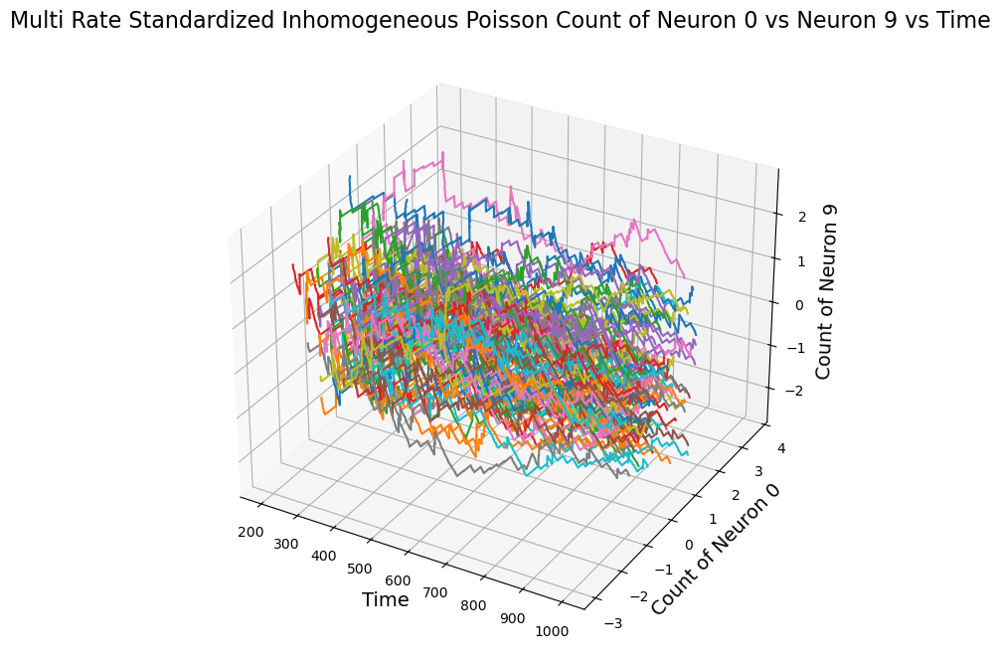

In [187]:
#plot_standardized_staircase_3d(random_samples, empirical_mean, empirical_std_dev, t0, num_samples=5)
plot_standardized_staircase_3d(multi_rate_count, multi_rate_empirical_mean, multi_rate_empirical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Standardized Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

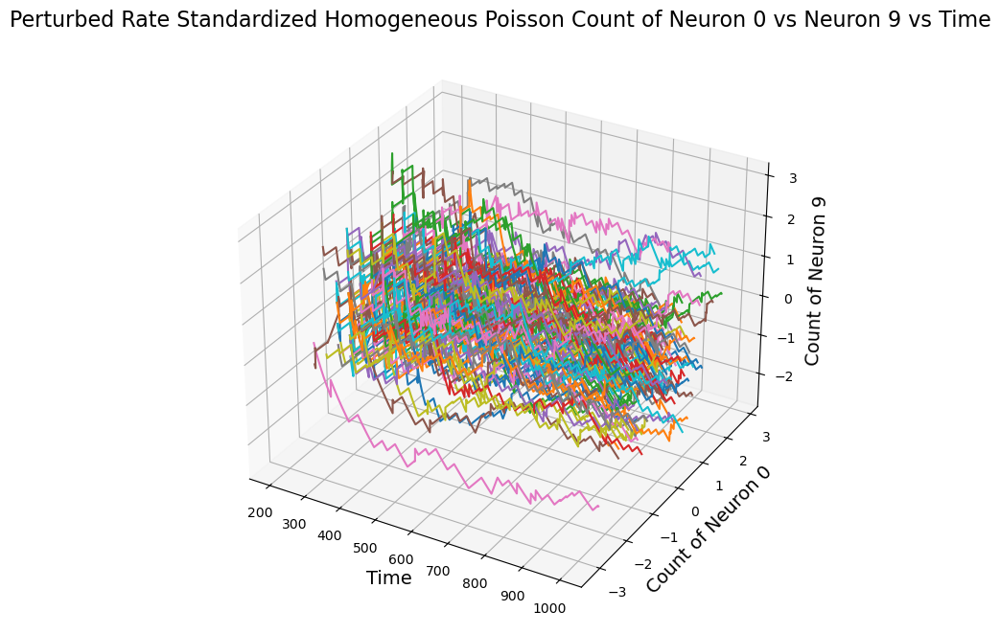

In [188]:
#plot_standardized_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, t0, num_samples=5)
plot_standardized_staircase_3d(perturbed_rate_count, perturbed_rate_theoretical_means, perturbed_rate_theoretical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Standardized Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

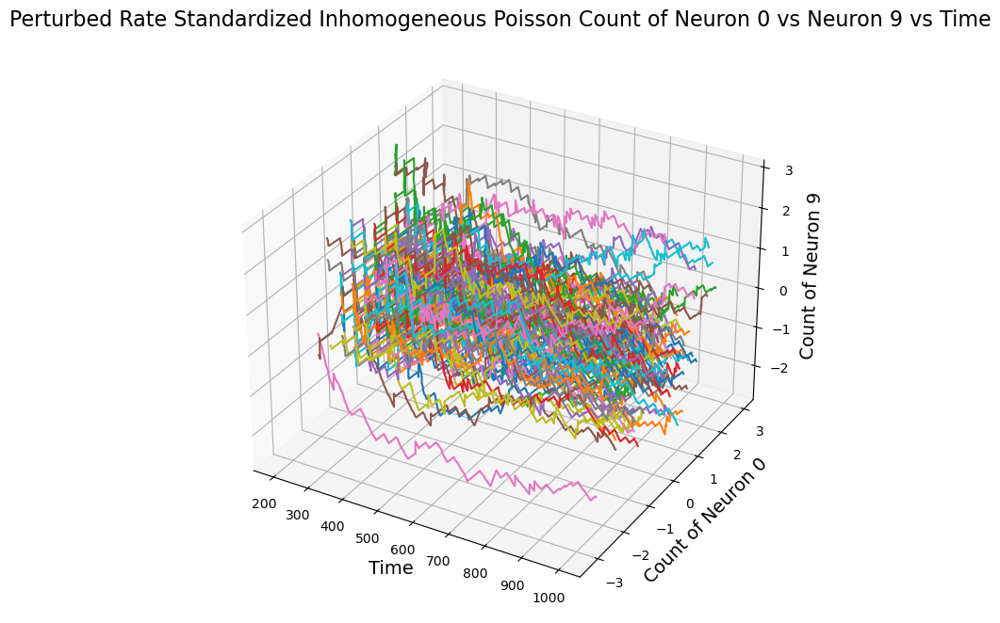

In [189]:
#plot_standardized_staircase_3d(random_samples, empirical_mean, empirical_std_dev, t0, num_samples=5)
plot_standardized_staircase_3d(perturbed_rate_count, perturbed_rate_empirical_mean, perturbed_rate_empirical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Standardized Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

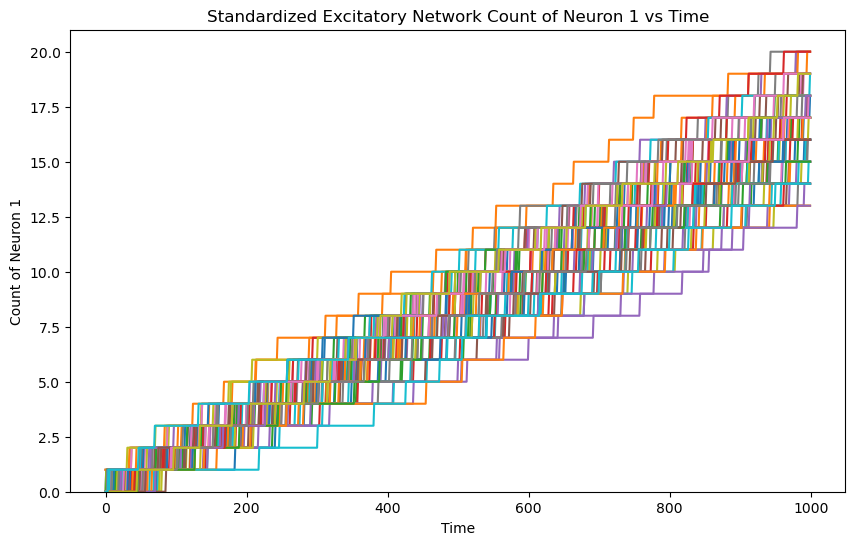

In [190]:
#plot_count_neuron1_vs_time(random_samples_ex, num_samples = 5)
plot_count_neuron1_vs_time(count_ex, num_samples, title = 'Standardized Excitatory Network Count of Neuron 1 vs Time')

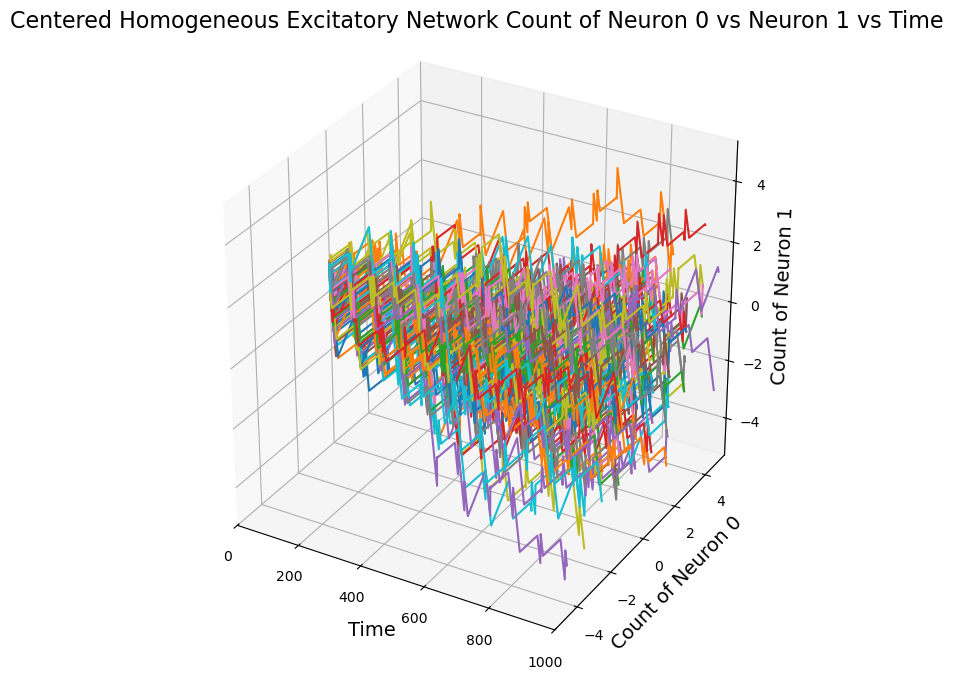

In [191]:
#plot_centered_staircase_3d(random_samples_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples= 5)
plot_centered_staircase_3d(count_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Homogeneous Excitatory Network Count of Neuron 0 vs Neuron 1 vs Time')

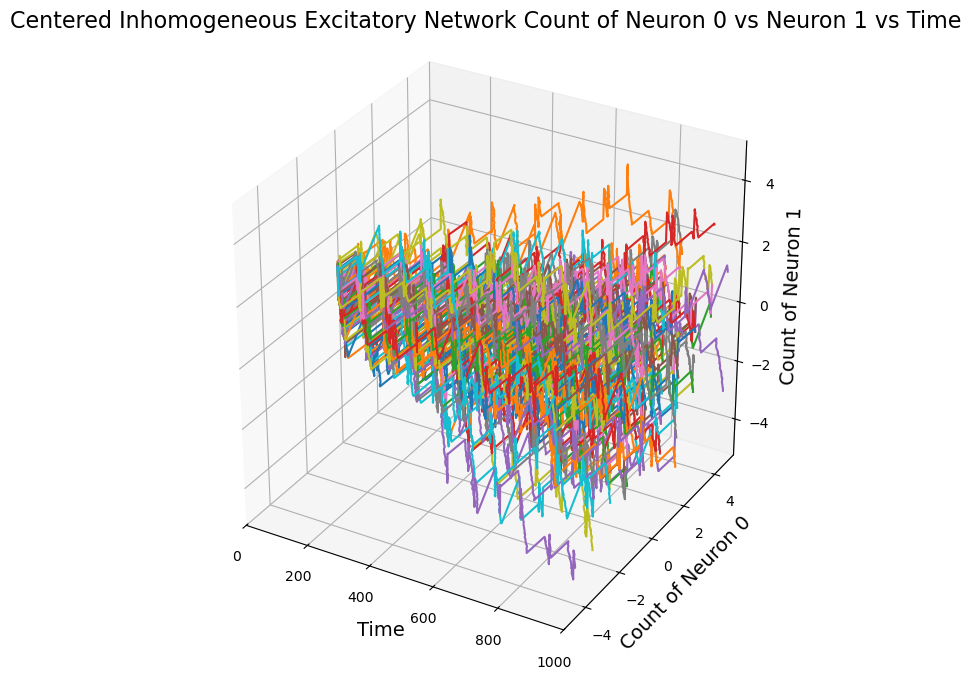

In [192]:
#plot_centered_staircase_3d(random_samples_ex, empirical_mean_ex, empirical_std_dev_ex, num_samples= 5)
plot_centered_staircase_3d(count_ex, empirical_mean_ex, empirical_std_dev_ex, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Inhomogeneous Excitatory Network Count of Neuron 0 vs Neuron 1 vs Time')

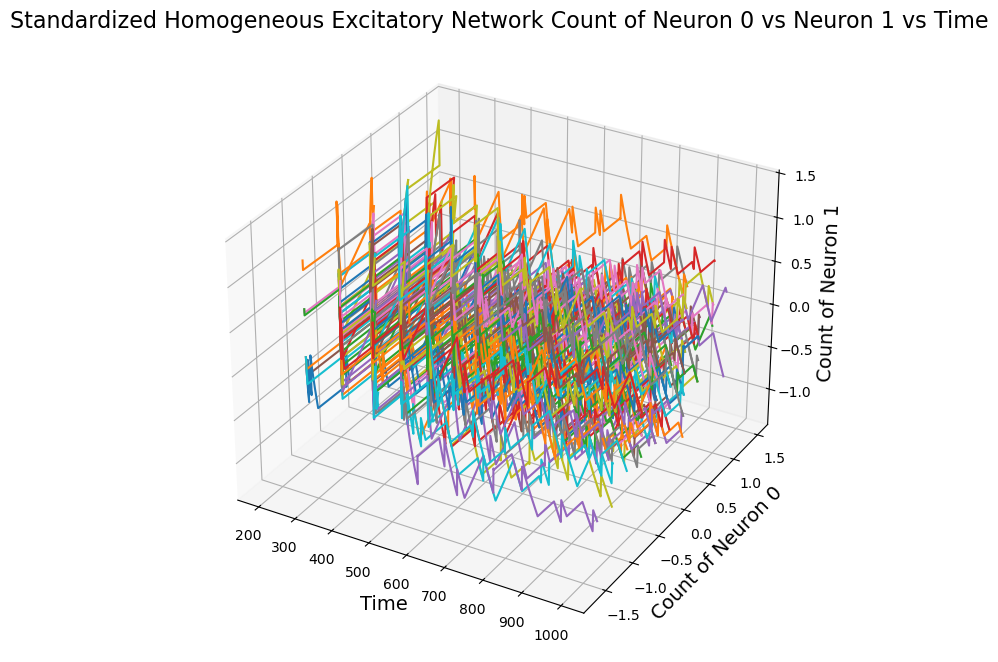

In [193]:
#plot_standardized_staircase_3d(random_samples_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, t0, num_samples=5)
plot_standardized_staircase_3d(count_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Homogeneous Excitatory Network Count of Neuron 0 vs Neuron 1 vs Time')

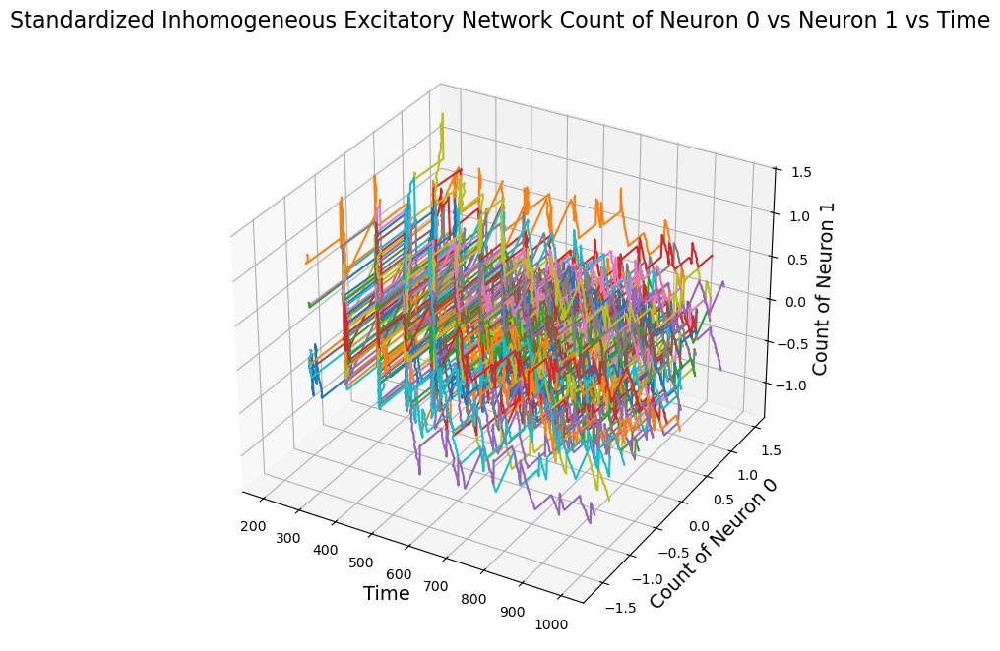

In [194]:
#plot_standardized_staircase_3d(random_samples_ex, empirical_mean_ex, empirical_std_dev_ex, t0, num_samples=5)
plot_standardized_staircase_3d(count_ex, empirical_mean_ex, empirical_std_dev_ex, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Inhomogeneous Excitatory Network Count of Neuron 0 vs Neuron 1 vs Time')

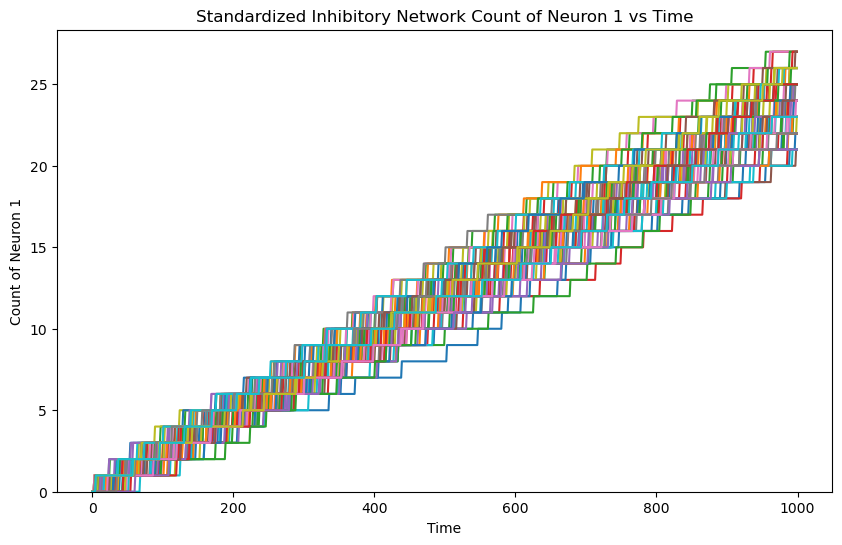

In [195]:
#plot_count_neuron1_vs_time(random_samples_in, num_samples = 5)
plot_count_neuron1_vs_time(count_in, num_samples, title = 'Standardized Inhibitory Network Count of Neuron 1 vs Time')

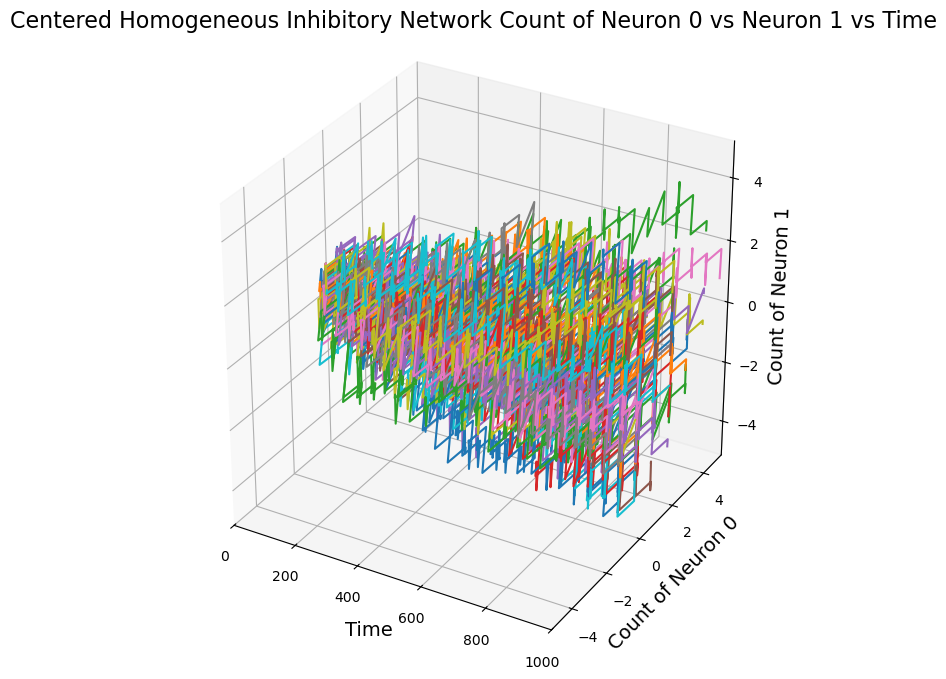

In [196]:
#plot_centered_staircase_3d(random_samples_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples= 5)
plot_centered_staircase_3d(count_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Homogeneous Inhibitory Network Count of Neuron 0 vs Neuron 1 vs Time')

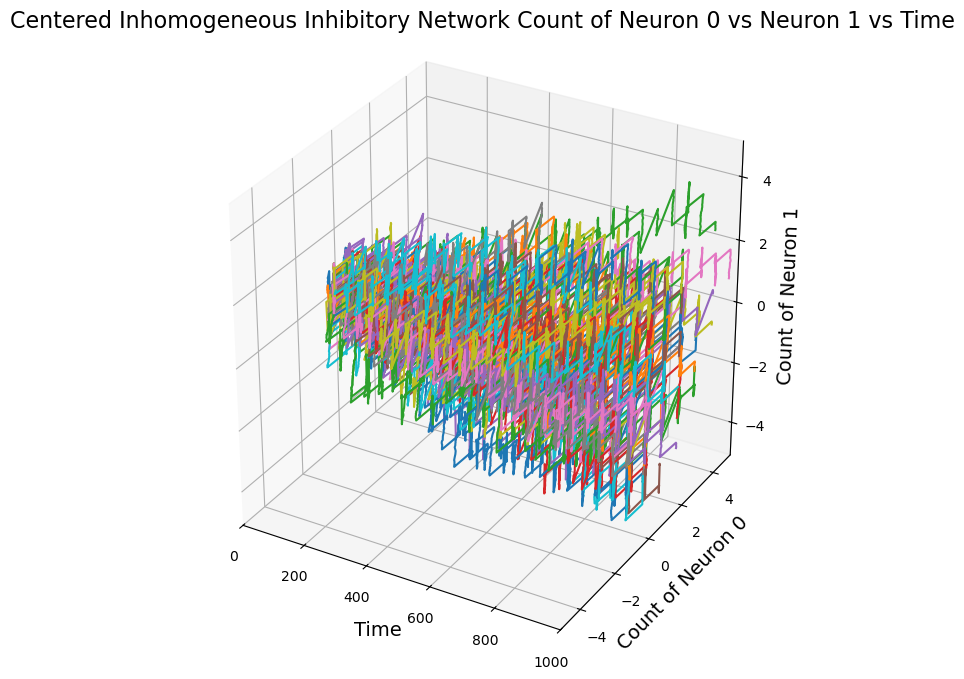

In [197]:
#plot_centered_staircase_3d(random_samples_in, empirical_mean_in, empirical_std_dev_in, num_samples= 5)
plot_centered_staircase_3d(count_in, empirical_mean_in, empirical_std_dev_in, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Inhomogeneous Inhibitory Network Count of Neuron 0 vs Neuron 1 vs Time')

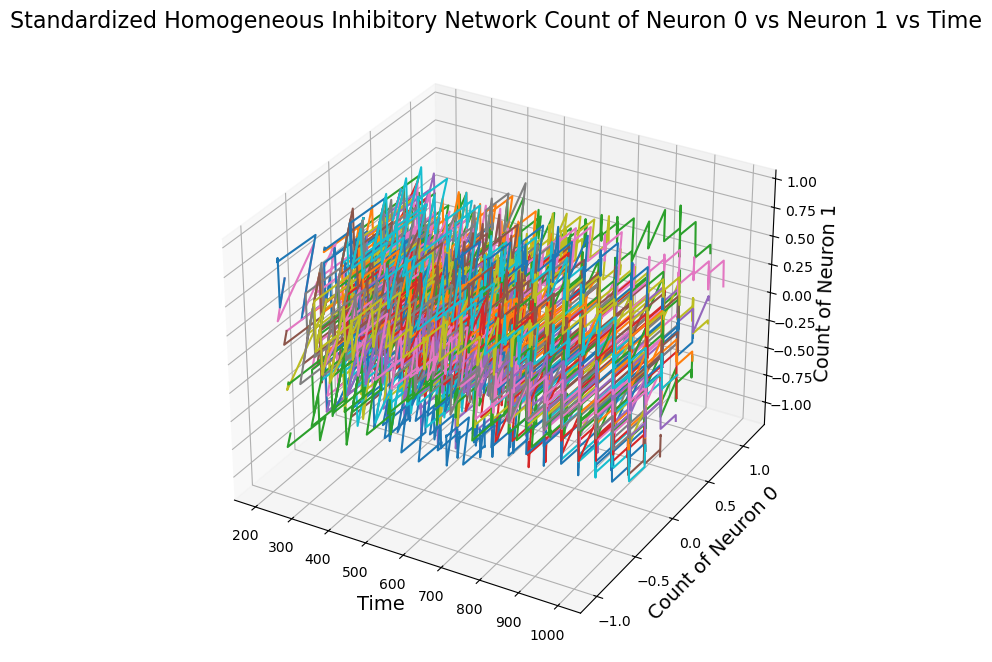

In [198]:
#plot_standardized_staircase_3d(random_samples_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, t0, num_samples=5)
plot_standardized_staircase_3d(count_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Homogeneous Inhibitory Network Count of Neuron 0 vs Neuron 1 vs Time')

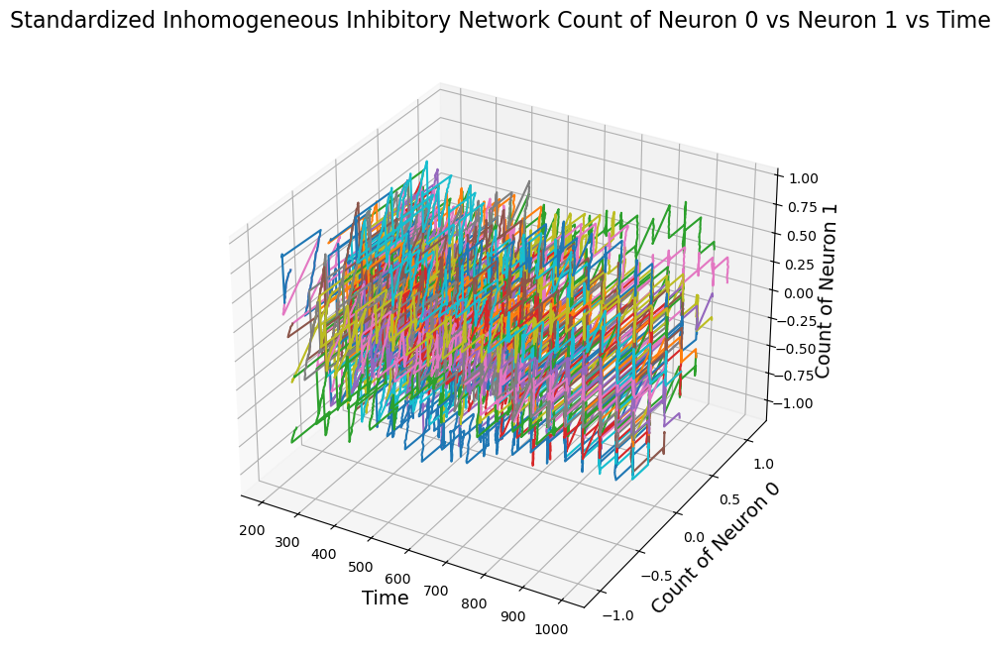

In [199]:
#plot_standardized_staircase_3d(random_samples_in, empirical_mean_in, empirical_std_dev_in, t0, num_samples=5)
plot_standardized_staircase_3d(count_in, empirical_mean_in, empirical_std_dev_in, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Inhomogeneous Inhibitory Network Count of Neuron 0 vs Neuron 1 vs Time')

(<Figure size 1200x700 with 2 Axes>,
 <Axes: title={'center': 'Standardized Poisson Count with Mean and Standard Deviation'}, xlabel='Time', ylabel='Statistical Values'>,
 <Axes: ylabel='Standardized Count'>)

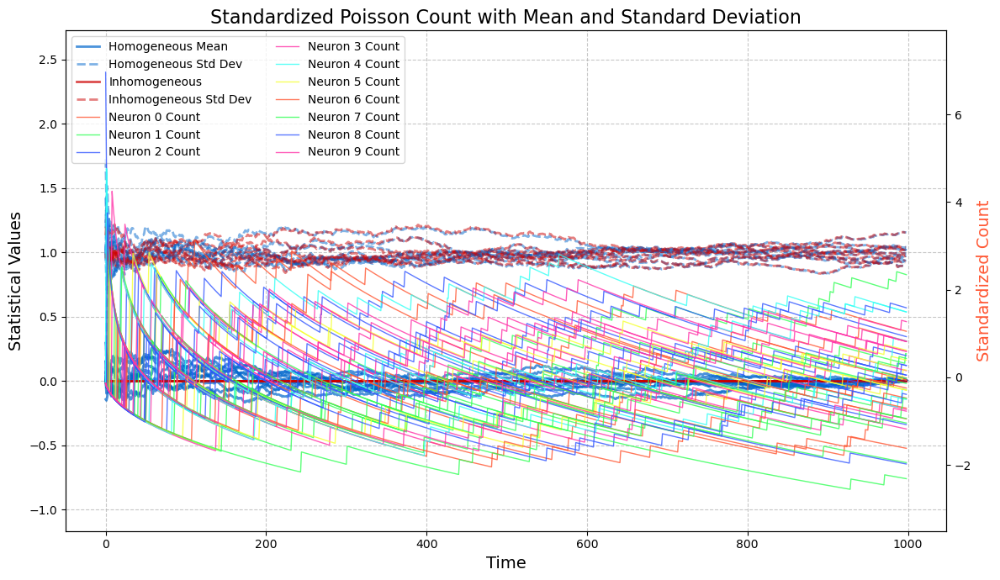

In [200]:
data_plot(stands, num_samples, standardized_mean, standardized_mean_emp, 
              standardized_std, standardized_std_emp, num_neurons, title= 'Standardized Poisson Count with Mean and Standard Deviation',
              figsize=(12, 7), max_samples_to_show=5)

(<Figure size 1200x700 with 2 Axes>,
 <Axes: title={'center': 'Standardized Exctitatory Count with Mean and Standard Deviation'}, xlabel='Time', ylabel='Statistical Values'>,
 <Axes: ylabel='Standardized Count'>)

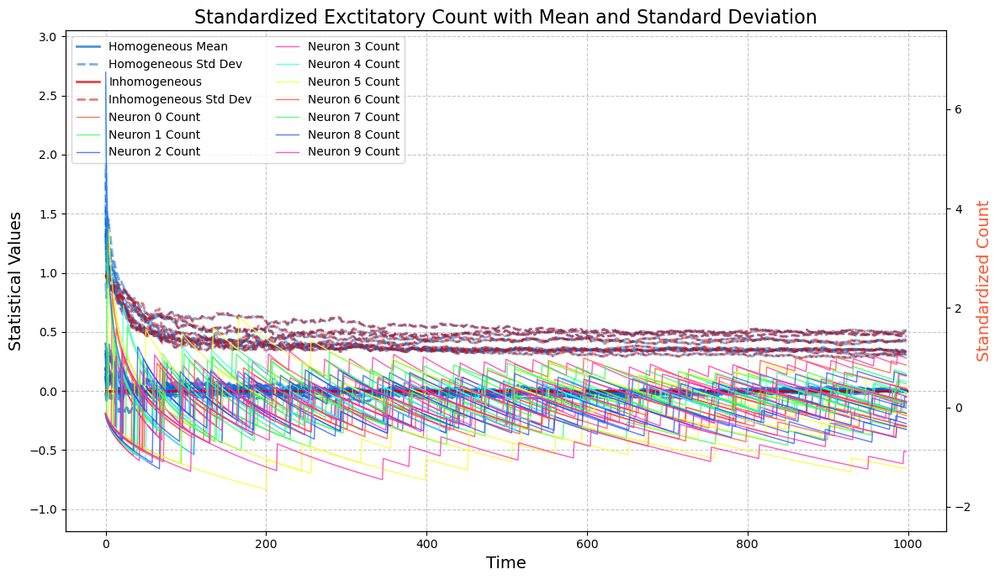

In [201]:
data_plot(stands_ex, num_samples, standardized_mean_ex, standardized_mean_ex_emp, 
              standardized_std_ex, standardized_std_ex_emp, num_neurons, title='Standardized Exctitatory Count with Mean and Standard Deviation',
              figsize=(12, 7), max_samples_to_show=5)

(<Figure size 1200x700 with 2 Axes>,
 <Axes: title={'center': 'Standardized Inhibitory Count with Mean and Standard Deviation'}, xlabel='Time', ylabel='Statistical Values'>,
 <Axes: ylabel='Standardized Count'>)

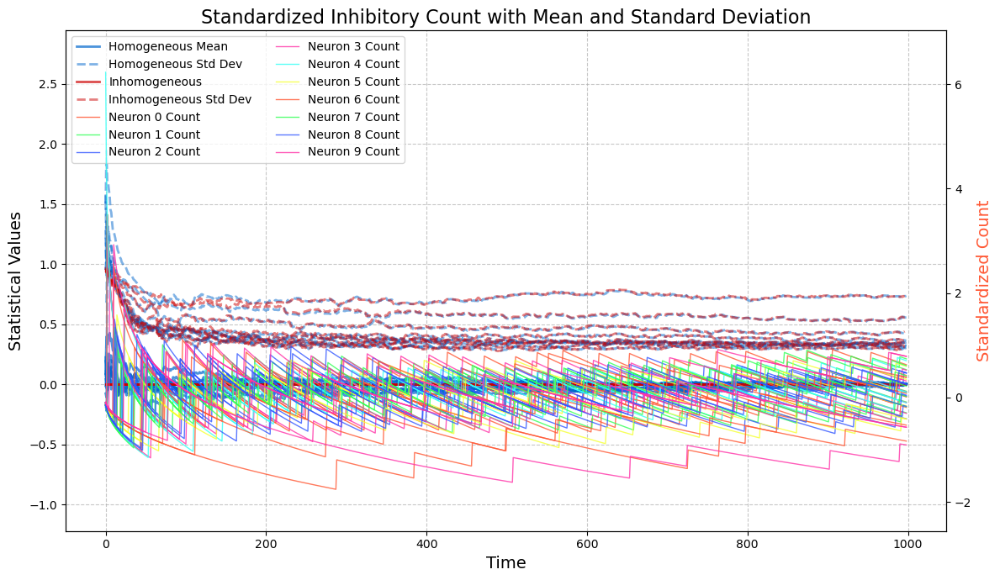

In [202]:
data_plot(stands_in, num_samples, standardized_mean_in, standardized_mean_in_emp, 
              standardized_std_in, standardized_std_in_emp, num_neurons, title='Standardized Inhibitory Count with Mean and Standard Deviation',
              figsize=(12, 7), max_samples_to_show=5)